# Machine Learning - Model Classifier 🤖🎯

What can Artificial Intelligence (AI) do? Well, perhaps even the answer you're reading right now was crafted by the non-mind of a machine.😵‍💫

Machine learning (ML) is a branch of AI that focuses on the development of algorithms and models that enable computers to learn from and make predictions or decisions based on data. In essence, ML algorithms enable computers to recognize patterns and relationships within data without being explicitly programmed for each task.

Model classification, a fundamental concept in ML, involves the process of training a model to classify or categorize input data into predefined classes or categories. The goal is to build a predictive model that can accurately assign labels or classes to new, unseen data based on patterns learned from training data.



# Library 📚

In [1]:
import os
import pandas as pd
import numpy as np



# Data Visaulisation
from itertools import combinations
import matplotlib.pyplot as plt
import seaborn as sns
import fastcluster
import scipy
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
%matplotlib inline

# Stats
import scipy.stats as stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statannotations.Annotator import Annotator
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import levene
from scipy.stats import kruskal
from scipy.stats import f_oneway
from scipy.stats import mannwhitneyu
import pingouin as pg #Post Hoc Games-Howell
import bootstrapped.bootstrap as bs
import bootstrapped.compare_functions as bs_compare
import bootstrapped.stats_functions as bs_stats
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import randint, uniform
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tools.tools import add_constant



from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler, LabelEncoder
from sklearn.cluster import KMeans, SpectralClustering, MiniBatchKMeans,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score, accuracy_score, confusion_matrix
from sklearn.manifold import TSNE
from sklearn.utils.multiclass import unique_labels
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import adjusted_rand_score
from sklearn.cross_decomposition import PLSRegression, PLSCanonical

from scipy.cluster.hierarchy import linkage, dendrogram
import math

# Models

from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.svm import SVC, LinearSVC
import xgboost as xgb
from sklearn.cluster import KMeans, SpectralClustering, MiniBatchKMeans,DBSCAN 
from sklearn.metrics import silhouette_samples, silhouette_score, accuracy_score, confusion_matrix
from sklearn.manifold import TSNE
from sklearn.utils.multiclass import unique_labels
from sklearn.decomposition import PCA
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
from itertools import cycle
from sklearn.model_selection import cross_val_predict



# Metrics
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import learning_curve


import joblib
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")

%config InlineBackend.figure_format = 'retina'
pd.options.display.float_format = '{:.3f}'.format

In [2]:
df = pd.read_excel('UPS.xlsx')
df

,Gender,Ethnicity,Donor_age,Age_Group,Region,Top_level_region,ATG7,NAE1,SAE1,UBA1,...,SMURF1,SMURF2,TRIP12,UBE3A,UBE3B,UBE3C,UBE3D,UBR5,WWP1,WWP2
0,M,E,8 pcw,Early prenatal,DFC,NP,2.944,5.970,6.606,5.579,...,2.306,3.446,3.966,4.905,1.727,2.827,0.592,2.729,2.066,2.912
1,M,E,8 pcw,Early prenatal,VFC,NP,2.807,5.435,6.345,5.851,...,2.643,3.426,4.173,5.181,1.939,2.854,0.500,3.206,2.023,3.451
2,M,E,8 pcw,Early prenatal,MFC,NP,2.781,5.987,6.571,5.707,...,2.618,3.542,4.229,5.009,1.831,2.799,0.602,3.189,2.060,3.205
3,M,E,8 pcw,Early prenatal,OFC,NP,3.258,5.482,6.372,5.393,...,2.499,3.221,3.986,4.726,1.678,2.964,0.635,2.628,2.079,3.876
4,M,E,8 pcw,Early prenatal,M1C-S1C,NP,2.862,5.464,6.092,6.132,...,3.083,3.719,4.514,5.119,2.308,2.898,0.568,3.939,2.053,3.667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,F,A,40 yrs,Adulthood,HIP,ACx,2.513,4.275,4.746,4.301,...,1.510,0.888,2.572,4.190,1.646,1.746,0.978,1.669,2.867,2.547
520,F,A,40 yrs,Adulthood,AMY,NP,2.550,4.312,4.346,4.155,...,1.778,1.624,2.589,4.345,1.626,2.212,1.092,2.136,2.841,2.892
521,F,A,40 yrs,Adulthood,STR,BN,2.478,4.244,4.152,4.717,...,2.873,2.648,3.639,3.975,2.284,2.775,0.893,2.384,3.250,3.544
522,F,A,40 yrs,Adulthood,MD,THM,2.351,4.348,4.277,4.908,...,2.400,2.157,3.724,4.016,1.903,2.660,0.607,2.182,2.741,3.177


For further details of the dataframe, please have a look at the the files 0 and 1

# Model Classification

#### Feature Engineering 🔮

For the data validation a new target variable was designated with the following classes:
* Class 0 (Adolescence_Adulthood): Encompassing ‘Adolescence’ and ‘Adulthood’
* Class 1 (Infancy_to_LateChildhood): ‘Infancy’, ‘Early childhood’, and ‘Late childhood’
* Class 2 (Prenatal): including 'Early prenatal', 'Early-mid prenatal', 'Late-mid prenatal'.

The ‘late prenatal’ group was excluded due to its a) borderline behaviour and b) small sample size (n=22), when compared to the other age groups.

Since categorical variables did not exhibit homogeneity across the three target classes, only numerical variables related to gene expression were considered to avoid artificial overfitting of the model. This approach ensured a more robust analysis, preventing the model from capturing spurious correlations and enhancing its generalization capabilities.

In [3]:
df_mc = df[df['Age_Group'] != 'Late prenatal']
df_mc['target'] = df_mc['Age_Group'].replace({'Early prenatal': 'Prenatal', 'Early mid-prenatal' : 'Prenatal',
                                       'Late mid-prenatal' : 'Prenatal',
                                       'Infancy' : 'Infancy_to_LateChildhood', 'Early childhood' : 'Infancy_to_LateChildhood', 
                                        'Late childhood' : 'Infancy_to_LateChildhood',
                                       'Adolescence' : 'Adolescence_Adulthood', 'Adulthood' : 'Adolescence_Adulthood'})
df_mc = df_mc.loc[:,'ATG7' : ]
df_mc

,ATG7,NAE1,SAE1,UBA1,UBA2,UBA3,UBA5,UBA6,UBA7,AKTIP,...,SMURF2,TRIP12,UBE3A,UBE3B,UBE3C,UBE3D,UBR5,WWP1,WWP2,target
0,2.944,5.970,6.606,5.579,6.318,4.216,3.065,3.254,0.388,3.107,...,3.446,3.966,4.905,1.727,2.827,0.592,2.729,2.066,2.912,Prenatal
1,2.807,5.435,6.345,5.851,6.024,4.137,3.051,3.390,0.255,2.945,...,3.426,4.173,5.181,1.939,2.854,0.500,3.206,2.023,3.451,Prenatal
2,2.781,5.987,6.571,5.707,6.106,4.042,3.063,3.358,0.284,3.051,...,3.542,4.229,5.009,1.831,2.799,0.602,3.189,2.060,3.205,Prenatal
3,3.258,5.482,6.372,5.393,5.880,4.126,2.939,3.118,0.659,3.131,...,3.221,3.986,4.726,1.678,2.964,0.635,2.628,2.079,3.876,Prenatal
4,2.862,5.464,6.092,6.132,5.822,3.819,3.123,3.418,0.485,3.068,...,3.719,4.514,5.119,2.308,2.898,0.568,3.939,2.053,3.667,Prenatal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,2.513,4.275,4.746,4.301,5.152,4.182,3.104,2.236,1.117,5.386,...,0.888,2.572,4.190,1.646,1.746,0.978,1.669,2.867,2.547,Adolescence_Adulthood
520,2.550,4.312,4.346,4.155,5.186,4.207,2.966,2.231,1.302,5.071,...,1.624,2.589,4.345,1.626,2.212,1.092,2.136,2.841,2.892,Adolescence_Adulthood
521,2.478,4.244,4.152,4.717,4.608,3.796,2.785,2.063,1.698,4.559,...,2.648,3.639,3.975,2.284,2.775,0.893,2.384,3.250,3.544,Adolescence_Adulthood
522,2.351,4.348,4.277,4.908,4.431,3.532,2.674,2.027,1.940,4.792,...,2.157,3.724,4.016,1.903,2.660,0.607,2.182,2.741,3.177,Adolescence_Adulthood


target
Prenatal                    215
Infancy_to_LateChildhood    144
Adolescence_Adulthood       143
Name: count, dtype: int64


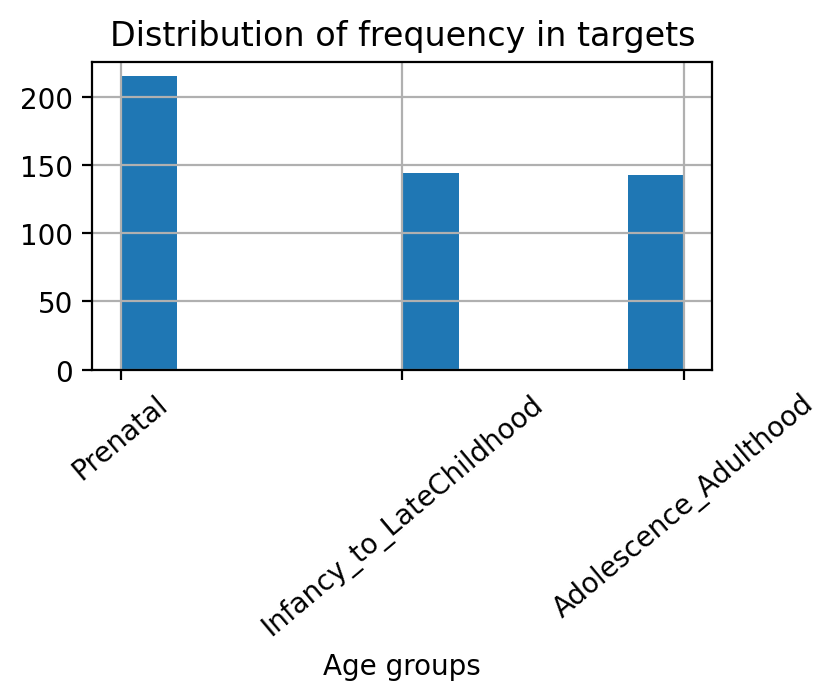

In [4]:
# Class distribution
plt.figure(figsize=(4,2))
plt.title('Distribution of frequency in targets')
plt.xlabel('Age groups')
plt.xticks(rotation=40)
df_mc.target.hist(grid=True);

print(df_mc.target.value_counts())

Classes are almost equally distributed

😎 Curiosity: Let's imagine we decide to merge the classes "Infancy_to_LateChildhood" and "Adolescence_Adulthood" and aim to create a classification machine learning model to predict whether a sample comes from a prenatal or postnatal subject. Now, let's entertain the notion of crafting the most idiotic of machine learning models, based on "Artificial Stupidity" 🤓, which simply predicts that the subject is always postnatal. Lo and behold, we hit the jackpot 287 times out of 502, achieving a whopping accuracy of 57%! 🤑

From this brilliant endeavor, we can derive a couple of observations:
 * A classification model should NOT solely rely on accuracy (our fantastically stupid model from before has a sensitivity of 0%) – well done, Captain Obvious! 🦸🏻‍♂️
 * No matter what efforts we put in from here on out, the minimum threshold we have to beat is 57%. So, if we end up with something hovering around 60%, well, let's just delete everything and never speak of it again. 😶‍🌫️🤐

#### Preprocessing 🤹🏻‍♂️
The dataframe has been split into _Train_ (80%) and _Test_ (20%) sets. The __"stratify"__ parameter has been used to ensure balanced classes during the split phase.
Numeric variables have been normalized using a scaler from the sklearn library, specifically the __MinMaxScaler__.
The MinMaxScaler is a preprocessing technique commonly used in machine learning to scale numeric features to a specified range, typically between 0 and 1. It works by subtracting the minimum value of the feature and then dividing by the difference between the maximum and minimum values, effectively bringing all values within the range specified. 
This normalization process aids in improving the performance and stability of machine learning algorithms.

In [5]:
X = df_mc.drop('target', axis=1)
y = df_mc['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

numeric_features = X.select_dtypes(include='number').columns
categorical_features = X.select_dtypes(exclude='number').columns

preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features) #Actually, not used
    ])

pipeline = Pipeline([
    ('preprocessor', preprocessor)
])

pipeline.fit(X_train, y_train)

X_train = pipeline.transform(X_train)
X_test = pipeline.transform(X_test)


In [7]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((401, 89), (401,), (101, 89), (101,))

#### Baseline models 👾

Before optimizing the machine learning model, we fed the data to the models and evaluated their performance on both the training and test sets using the 'print_results' function. Initially, as supervised algorithms for the Model Classification the k-neighbour classification (_KNN_), Random Forest (_RF_), and Support Vector Classifier (_SVC_) were employed. The F1 Score was choosen as the metric of interest. 


                    Note: F1 Score = 2 * Precision * Recall / (Precision + Recall)

Brief explanation of each model:

* __KNN__ (K-Nearest Neighbors): A non-parametric method used for classification and regression. It classifies data points based on the majority class of their nearest neighbors.
* __SVC__ (Support Vector Classifier): A supervised learning algorithm used for classification tasks. It works by finding the hyperplane that best separates the classes in the feature space.
* __DT__ (Decision Tree): A non-parametric supervised learning method used for classification and regression tasks. It splits the dataset into smaller subsets based on the most significant feature at each node, resulting in a tree-like structure where leaf nodes represent class labels.
* __RF__ (Random Forest): A versatile ensemble learning method that combines multiple decision trees to improve generalization and robustness. It constructs a multitude of decision trees during training and outputs the class that is the mode of the classes of the individual trees.



In [6]:
def print_results(model, title, y_train_true, y_train_pred, y_test_true, y_test_pred):
    # Classification report and confusion matrix for the training set
    print("Training Set:")
    print(classification_report(y_train_true, y_train_pred))
    f1_train = f1_score(y_train_true, y_train_pred, average='weighted')
    print(f'{model}: F1 Score for Training Set:', "{:.3f}".format(f1_train))
    cm_train = confusion_matrix(y_train_true, y_train_pred)
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=np.unique(y_train_true))
    disp_train.plot(cmap='Blues')
    plt.title(f'Training Set - {model}')
    plt.xticks(rotation=90)
    plt.show()

    # Classification report and confusion matrix for the test set
    print("Test Set:")
    print(classification_report(y_test_true, y_test_pred))
    f1_test = f1_score(y_test_true, y_test_pred, average='weighted')
    print(f'{model}: F1 Score for Test Set:', "{:.3f}".format(f1_test))
    cm_test = confusion_matrix(y_test_true, y_test_pred)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=np.unique(y_test_true))
    disp_test.plot(cmap='Blues')
    plt.title(f'Test Set - {model}')
    plt.xticks(rotation=90)
    plt.show()



# Define a function able to generate very simple clf models
# Threshold really not necessary even because is based on 'Accuracy' score and not the F1
def baseline_models(models, title, X_train, y_train, X_test, y_test):
    threshold = 0
    for model in models:
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        current_accuracy = accuracy_score(y_test, y_test_pred)
        if current_accuracy > threshold:
            threshold = current_accuracy
        
        print_results(model, title, y_train, y_train_pred, y_test, y_test_pred)
    
    return threshold


Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.93      0.96      0.95       114
Infancy_to_LateChildhood       0.96      0.93      0.95       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.97       401
               macro avg       0.97      0.97      0.97       401
            weighted avg       0.97      0.97      0.97       401

KNeighborsClassifier(): F1 Score for Training Set: 0.970


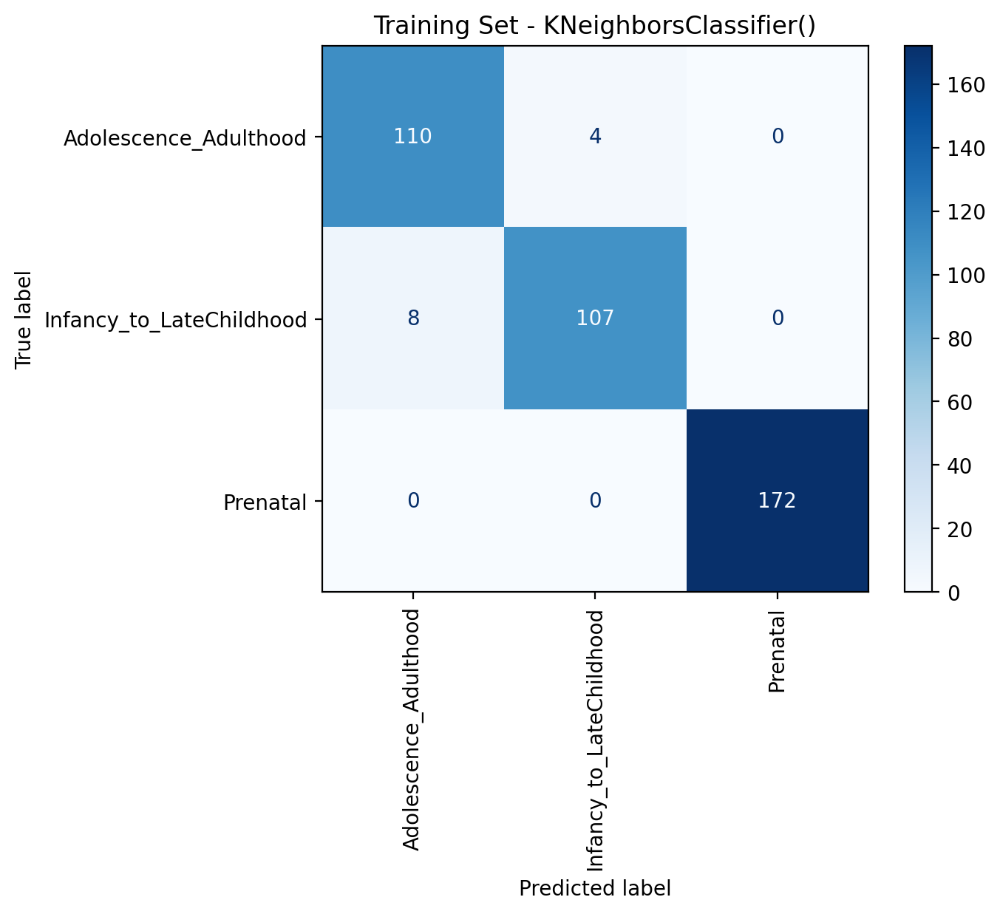

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.87      0.90      0.88        29
Infancy_to_LateChildhood       0.89      0.86      0.88        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.93       101
               macro avg       0.92      0.92      0.92       101
            weighted avg       0.93      0.93      0.93       101

KNeighborsClassifier(): F1 Score for Test Set: 0.931


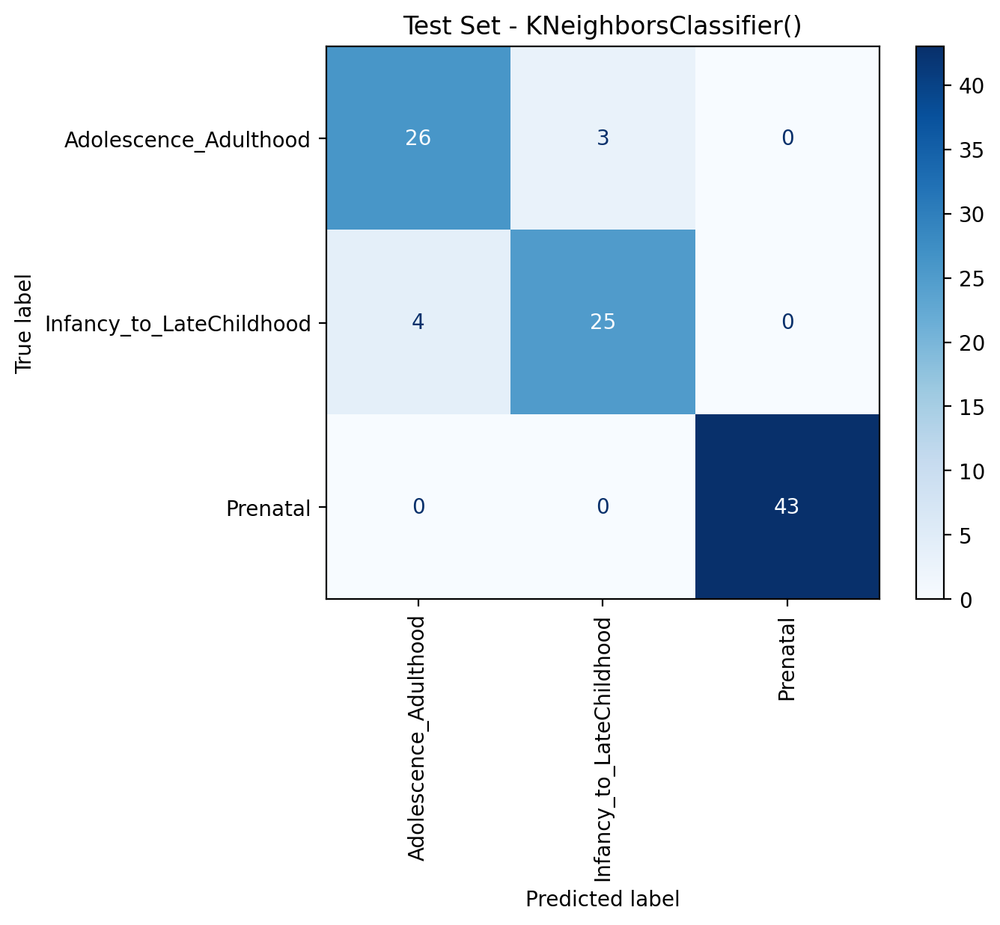

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       1.00      1.00      1.00       114
Infancy_to_LateChildhood       1.00      1.00      1.00       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           1.00       401
               macro avg       1.00      1.00      1.00       401
            weighted avg       1.00      1.00      1.00       401

DecisionTreeClassifier(random_state=42): F1 Score for Training Set: 1.000


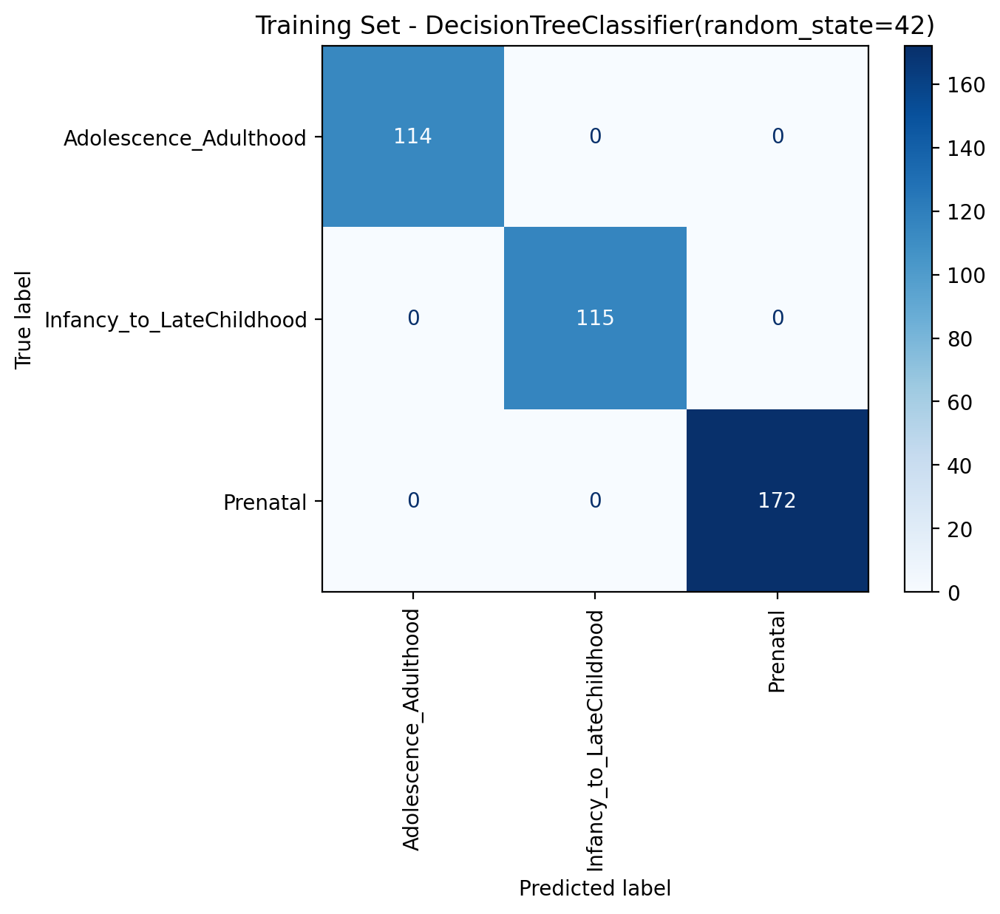

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.90      0.66      0.76        29
Infancy_to_LateChildhood       0.74      0.90      0.81        29
                Prenatal       0.96      1.00      0.98        43

                accuracy                           0.87       101
               macro avg       0.87      0.85      0.85       101
            weighted avg       0.88      0.87      0.87       101

DecisionTreeClassifier(random_state=42): F1 Score for Test Set: 0.868


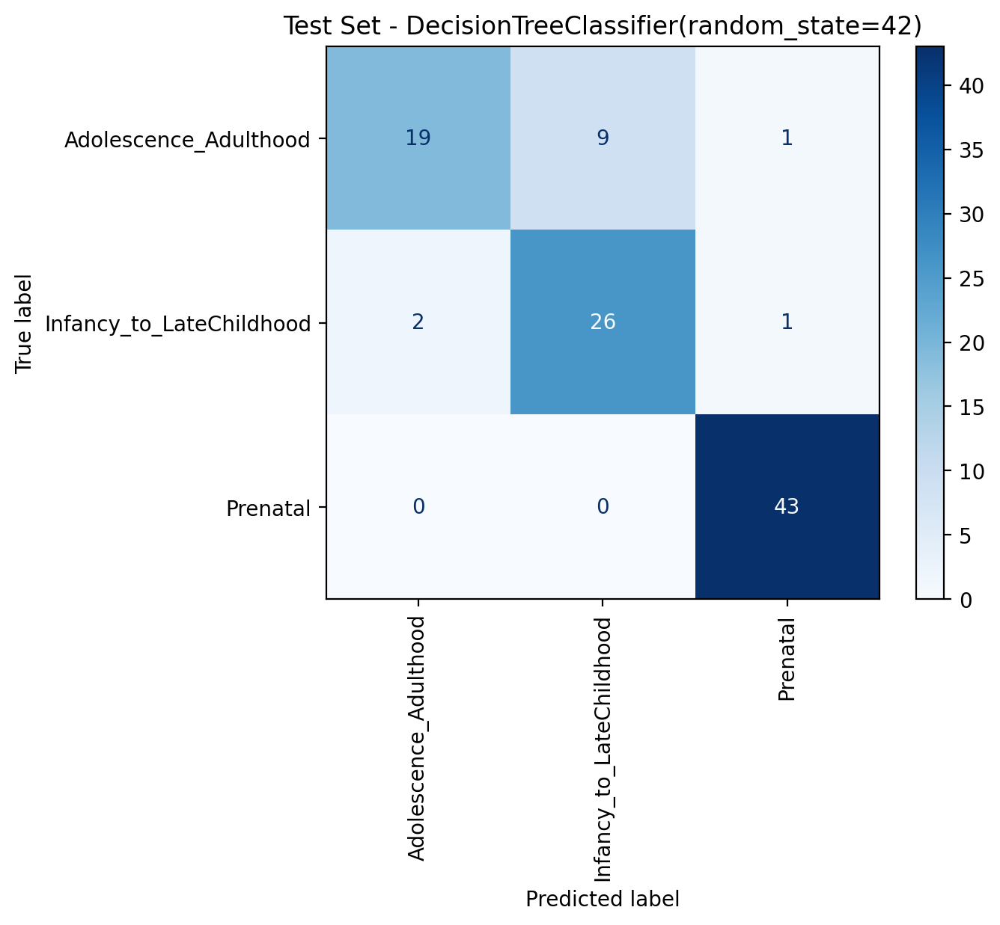

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       1.00      1.00      1.00       114
Infancy_to_LateChildhood       1.00      1.00      1.00       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           1.00       401
               macro avg       1.00      1.00      1.00       401
            weighted avg       1.00      1.00      1.00       401

RandomForestClassifier(random_state=42): F1 Score for Training Set: 1.000


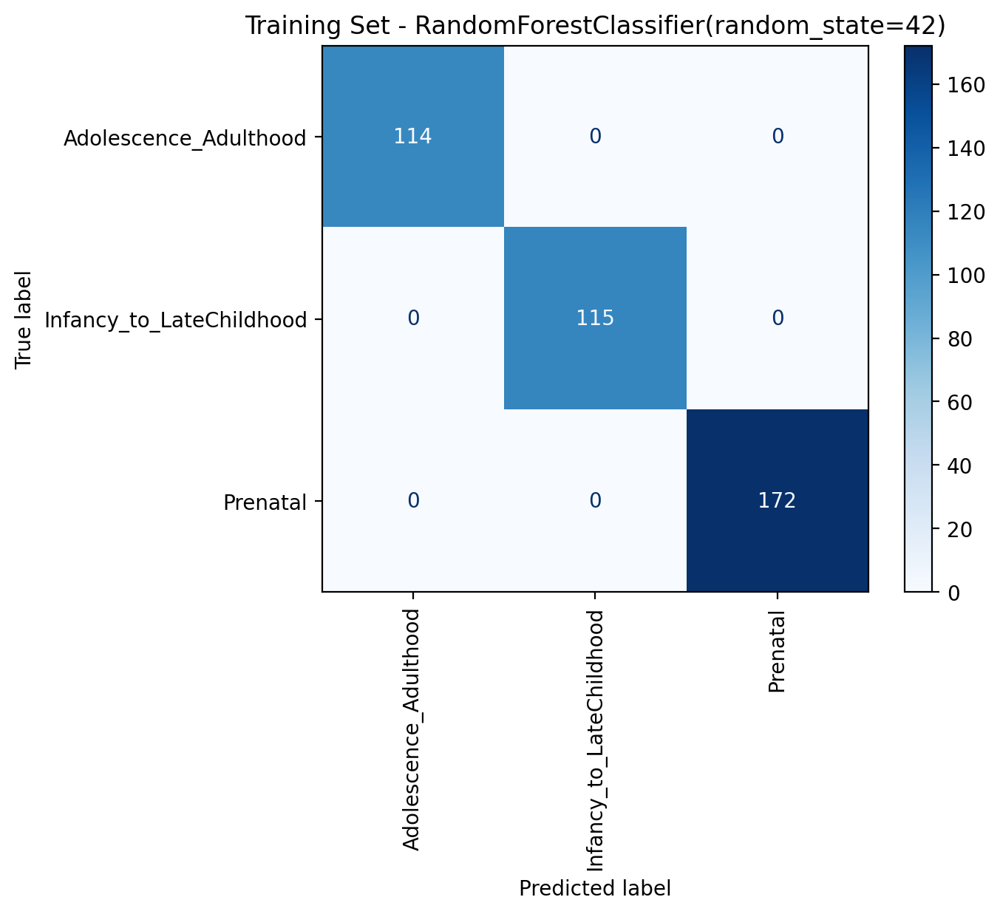

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.93      0.86      0.89        29
Infancy_to_LateChildhood       0.87      0.93      0.90        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.94       101
               macro avg       0.93      0.93      0.93       101
            weighted avg       0.94      0.94      0.94       101

RandomForestClassifier(random_state=42): F1 Score for Test Set: 0.941


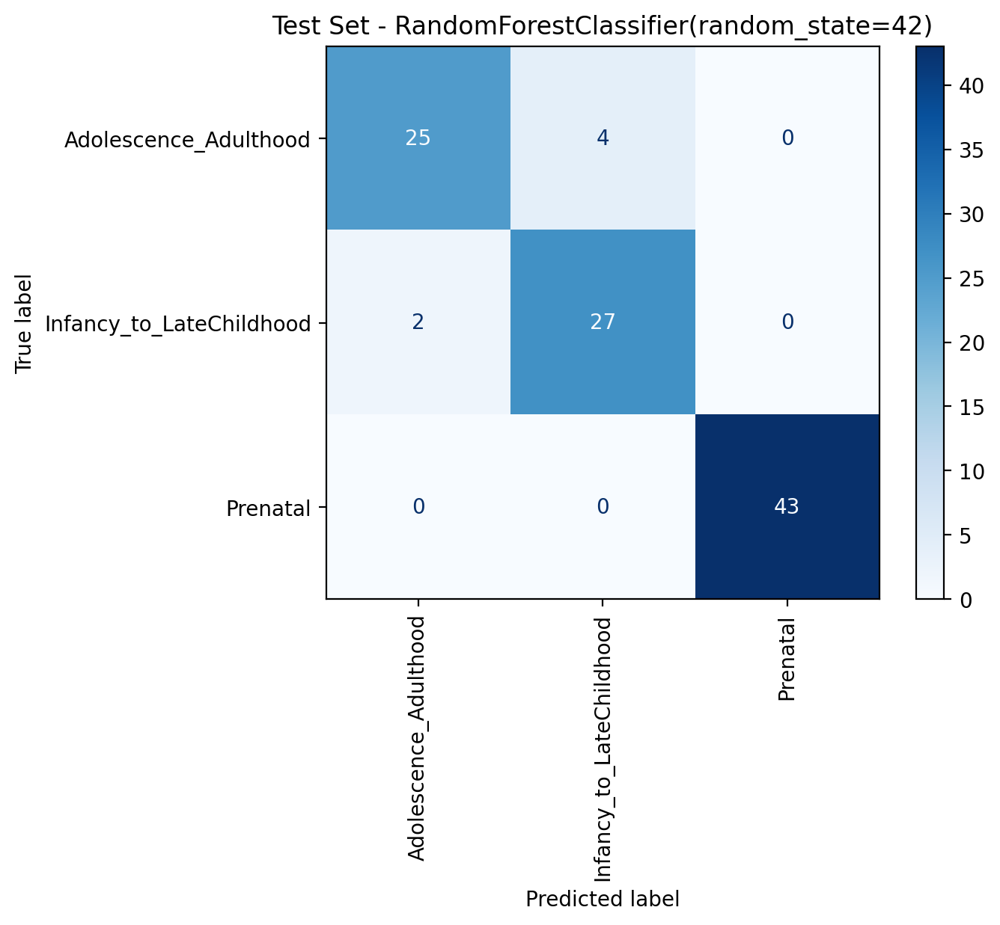

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.98      0.99      0.99       114
Infancy_to_LateChildhood       0.99      0.98      0.99       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.99       401
               macro avg       0.99      0.99      0.99       401
            weighted avg       0.99      0.99      0.99       401

SVC(): F1 Score for Training Set: 0.993


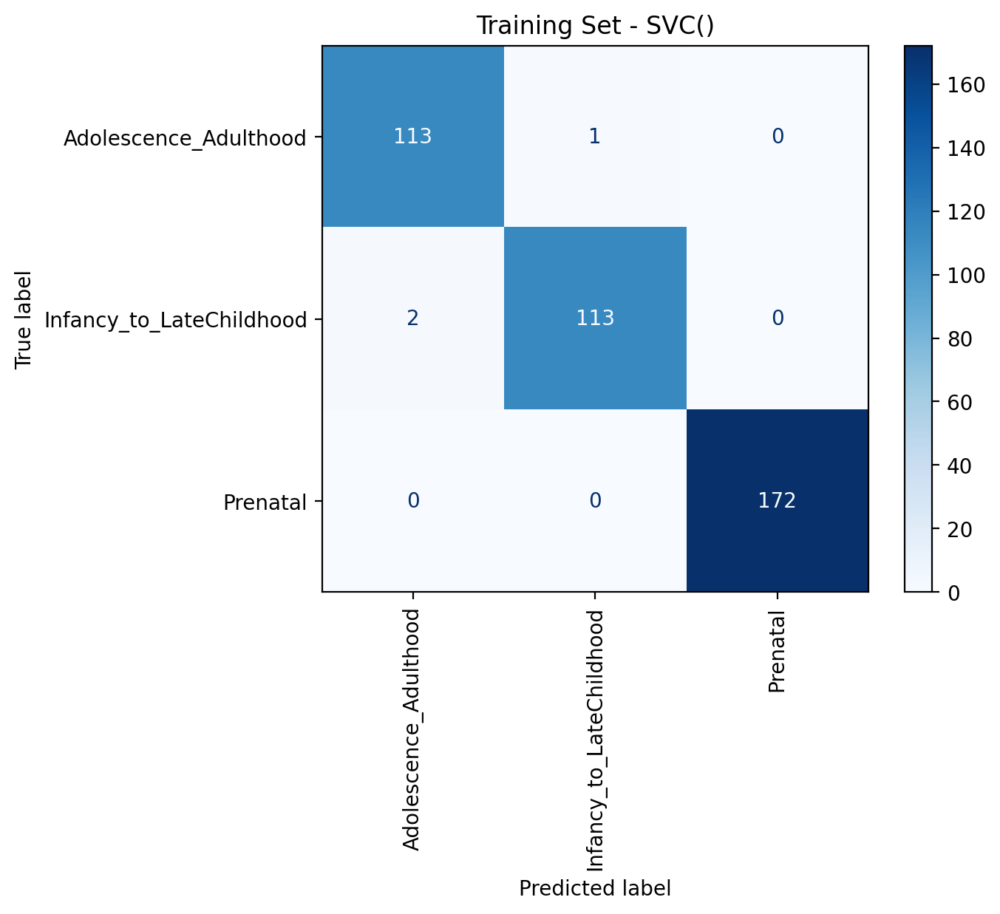

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.93      0.86      0.89        29
Infancy_to_LateChildhood       0.87      0.93      0.90        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.94       101
               macro avg       0.93      0.93      0.93       101
            weighted avg       0.94      0.94      0.94       101

SVC(): F1 Score for Test Set: 0.941


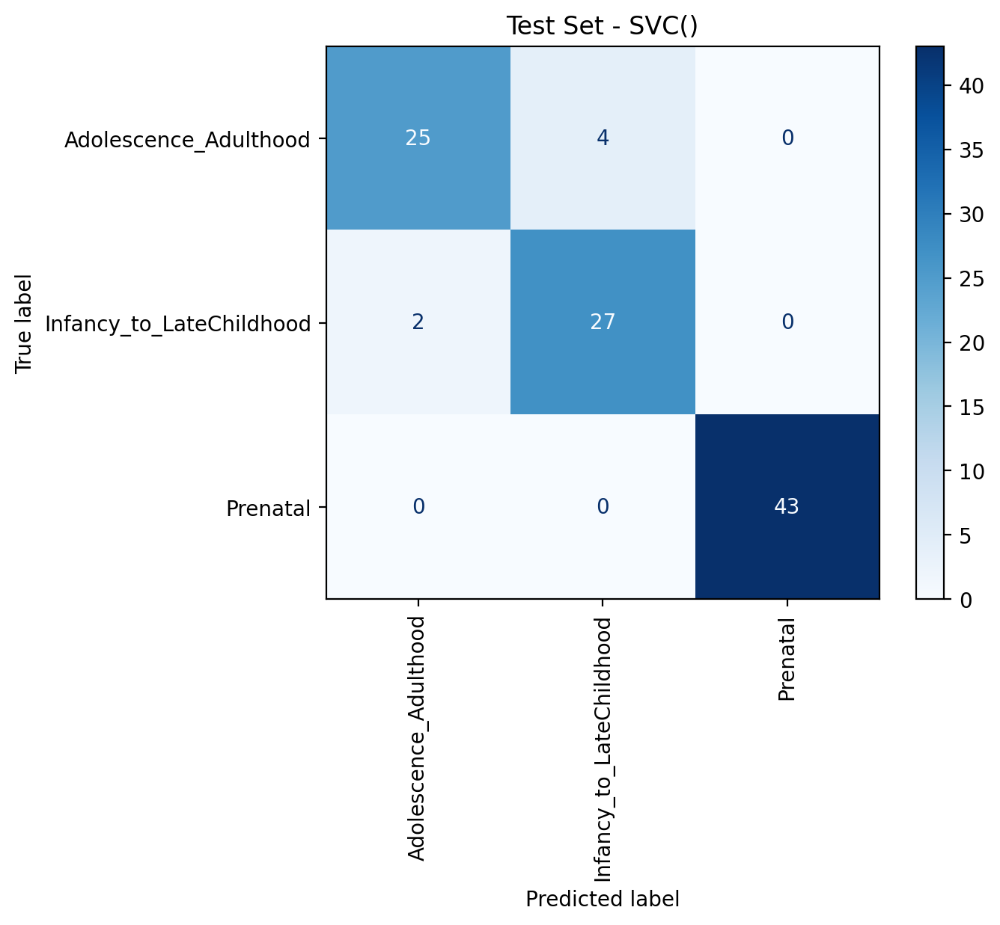

In [31]:
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier(random_state=42)
rf = RandomForestClassifier(random_state=42)
svc = SVC()


classifiers = [knn, dt, rf, svc]
title = None
threshold = baseline_models(classifiers, title, X_train, y_train, X_test, y_test)

Nice results! 🤩 But... let's not get carried away with enthusiasm just yet. Let's take a look at DT and RF, for example: the F1 score value for the training set is equal to 1, but it drops drastically in the test set. The model has probably encountered one of our worst enemies... __overfitting__! 🧟‍♂️😱
Overfitting occurs when a machine learning model learns the training data too well, capturing noise or random fluctuations rather than the underlying patterns. As a result, the model performs well on the training set but poorly on unseen data, failing to generalize.
To address overfitting and optimize our models, we utilized __hyperparameter tuning__. 🦸🏼‍♀️


#### Hyperparameter tuning 👩🏻‍🔬
Hyperparameters are parameters whose values are set before the learning process begins. Tuning these hyperparameters involves finding the best combination that maximizes the model's performance on unseen data. 🙈

For hyperparameter tuning, we employed the $StratifiedKFold$ function from the sklearn library. This function performs cross-validation while ensuring that each fold preserves the proportion of samples for each class, which is crucial for maintaining the integrity of the dataset's distribution.

Here's a brief overview of how StratifiedKFold works: It splits the dataset into k folds while preserving the percentage of samples for each class in every fold. This technique helps prevent bias and variance issues that may arise from uneven class distributions.

We set the number of folds (CV) to 5, meaning the dataset was divided into 5 equal parts for cross-validation. Each model was then subjected to grid search, a technique that exhaustively searches through a specified hyperparameter space to find the optimal values.

The evaluation metric used throughout this process was the F1 score as explained above.

This entire process was repeated for each model, ensuring that we fine-tuned the hyperparameters to enhance the overall performance and generalization ability of our models. 

Right away you'll found a function named 'grid_search_model'. Before to execute it, I suggest to read about the meaning of the parameters in each model that you can find in the sklearn documentation 🧞‍♂️

In [32]:
from sklearn.model_selection import StratifiedKFold


def grid_search_model(model, param_grid, title, X_train, y_train, X_test, y_test, cv):
    #grid_search = GridSearchCV(model, param_grid, scoring='f1_weighted', cv=cv)
    

    cv = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42) 
    grid_search = GridSearchCV(model, param_grid, scoring='f1_weighted', cv=cv)

    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_
    print('Best Hyperparameters: ', grid_search.best_params_)
    print()

    # cross-validation to obtain predictions on the train set
    y_pred_train = cross_val_predict(best_model, X_train, y_train, cv=cv)

    # test set prediction
    y_pred_test = best_model.predict(X_test)

    # Use print results function explained before
    print_results(best_model, title=title, y_train_true=y_train, y_train_pred=y_pred_train, y_test_true=y_test, y_test_pred=y_pred_test)


    return best_model

In [33]:
cv = 5 # this is also a parameter that you can change

Best Hyperparameters:  {'metric': 'minkowski', 'n_neighbors': 3, 'weights': 'distance'}

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.91      0.91      0.91       114
Infancy_to_LateChildhood       0.91      0.91      0.91       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.95       401
               macro avg       0.94      0.94      0.94       401
            weighted avg       0.95      0.95      0.95       401

KNeighborsClassifier(n_neighbors=3, weights='distance'): F1 Score for Training Set: 0.950


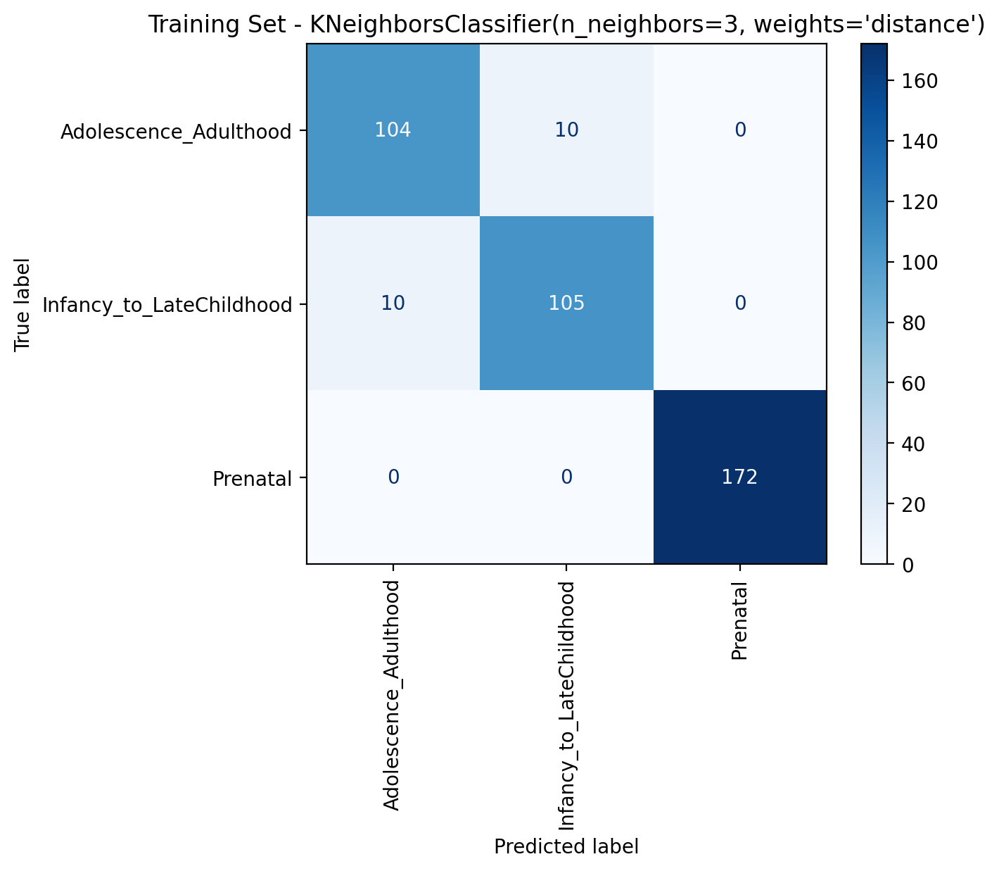

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.90      0.97      0.93        29
Infancy_to_LateChildhood       0.96      0.90      0.93        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.96       101
               macro avg       0.96      0.95      0.95       101
            weighted avg       0.96      0.96      0.96       101

KNeighborsClassifier(n_neighbors=3, weights='distance'): F1 Score for Test Set: 0.960


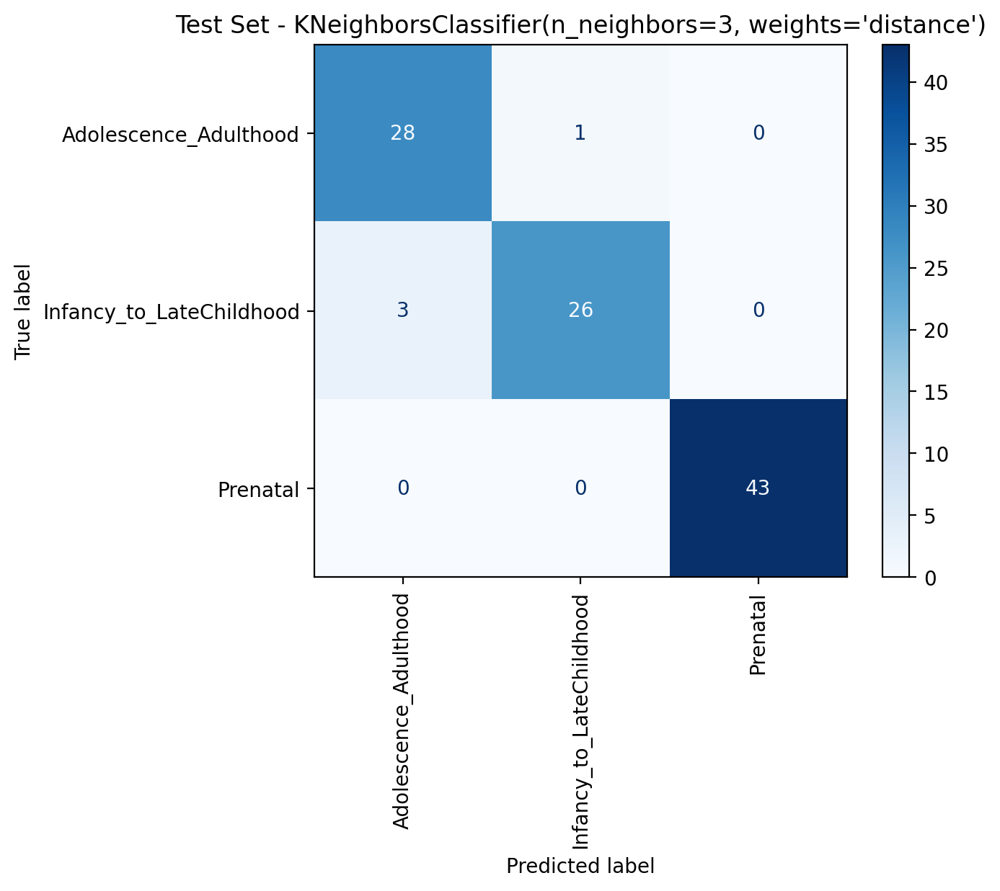

In [34]:
param_grid_knn = {
    'n_neighbors': [3], # n-neighbors
    'weights': ['uniform', 'distance'], # type of metric using
    'metric': ['minkowski', 'euclidean'] # Options fo calculate the distance
}
title_knn = 'KNN : Grid Search'
knn_grid = grid_search_model(knn, param_grid_knn, title_knn, X_train,  y_train, X_test, y_test, cv)

Great Result! 

Best Hyperparameters:  {'C': 0.1, 'class_weight': 'balanced', 'kernel': 'linear', 'probability': True}

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.86      0.89      0.88       114
Infancy_to_LateChildhood       0.89      0.86      0.88       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.93       401
               macro avg       0.92      0.92      0.92       401
            weighted avg       0.93      0.93      0.93       401

SVC(C=0.1, class_weight='balanced', kernel='linear', probability=True): F1 Score for Training Set: 0.930


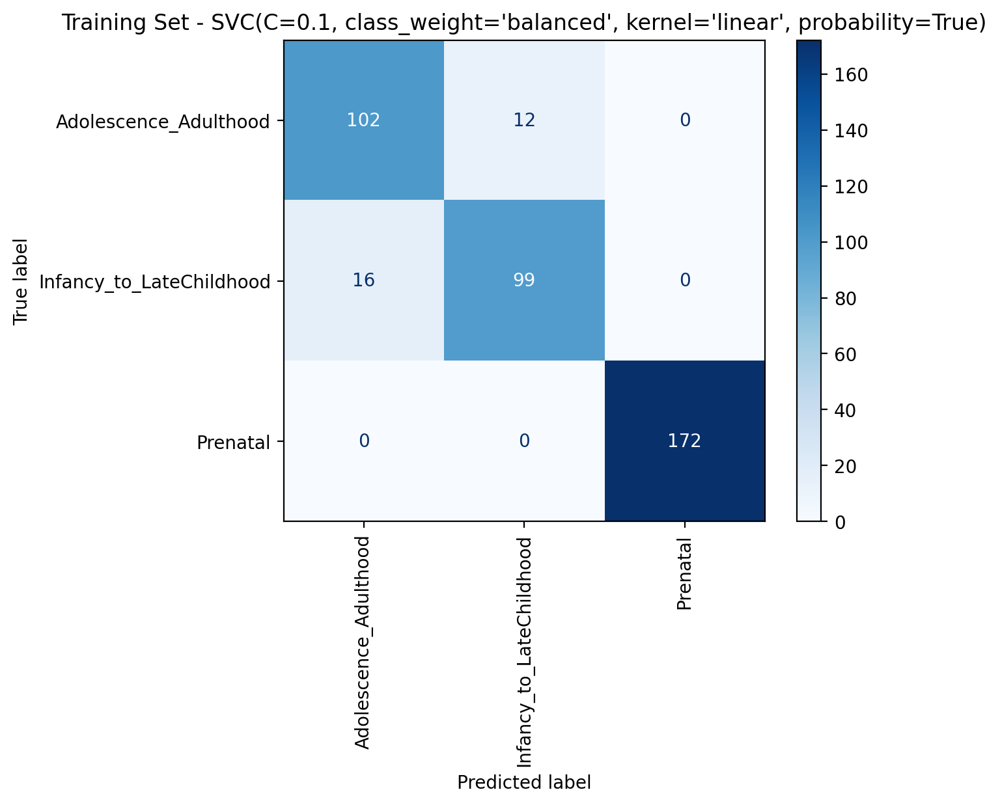

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.84      0.90      0.87        29
Infancy_to_LateChildhood       0.89      0.83      0.86        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.92       101
               macro avg       0.91      0.91      0.91       101
            weighted avg       0.92      0.92      0.92       101

SVC(C=0.1, class_weight='balanced', kernel='linear', probability=True): F1 Score for Test Set: 0.921


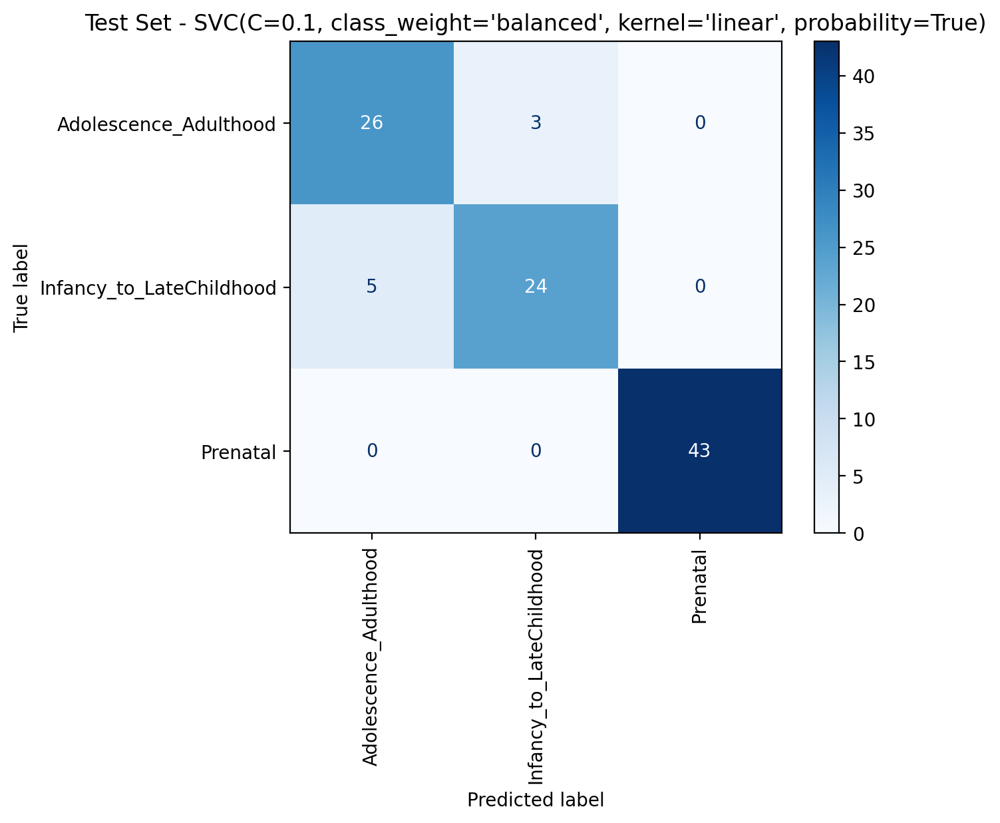

In [35]:
param_grid_svc = {'class_weight' : ['balanced'],
                'kernel': ['rbf', 'linear'],
                'probability': [ True],
                'C': [0.1] #interesting: valore di C più alto rende il modello più complesso e meno tollerante agli errori di classificazione sui dati di addestramento, mentre un valore di C più basso rende il modello più semplice e più tollerante agli errori di classificazione.
                }
title_svc = 'SVC: Grid Search'
svc_grid= grid_search_model(svc, param_grid_svc, title_svc, X_train,  y_train, X_test, y_test, cv)

Good Job!

Best Hyperparameters:  {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 5, 'max_leaf_nodes': 9, 'min_samples_leaf': 5}

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.92      0.89      0.90       114
Infancy_to_LateChildhood       0.87      0.90      0.88       115
                Prenatal       0.98      0.98      0.98       172

                accuracy                           0.93       401
               macro avg       0.92      0.92      0.92       401
            weighted avg       0.93      0.93      0.93       401

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_leaf_nodes=9, min_samples_leaf=5,
                       random_state=42): F1 Score for Training Set: 0.930


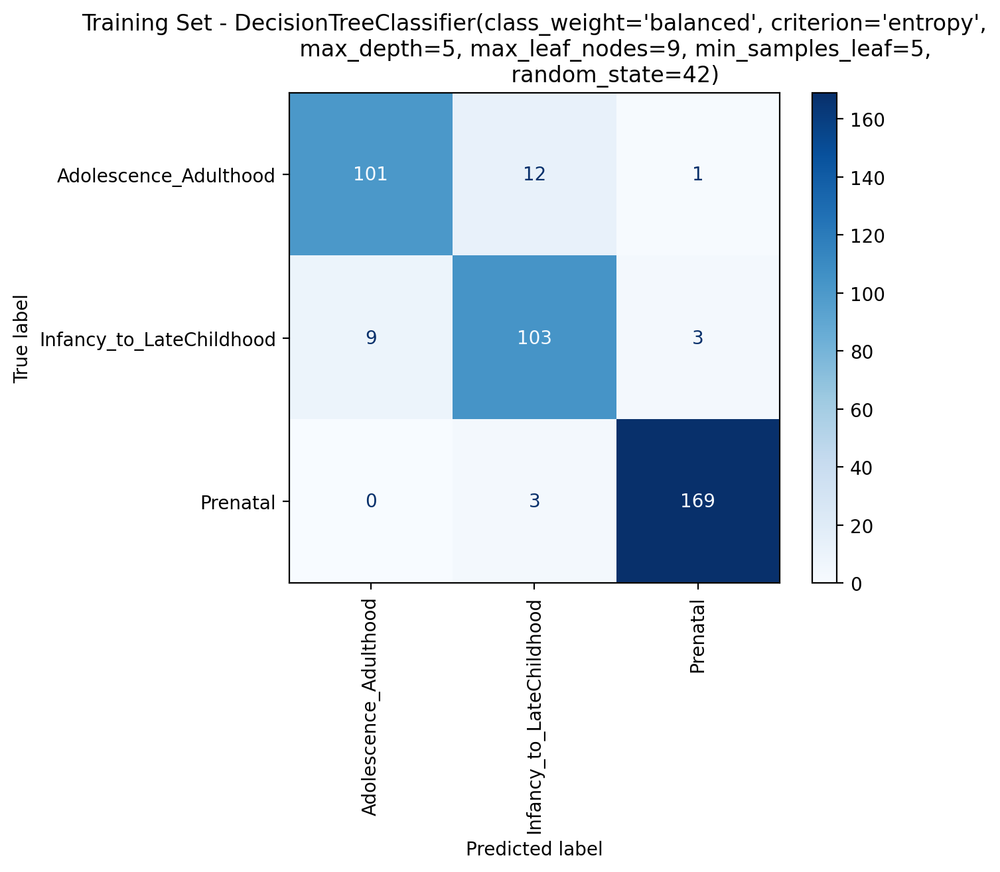

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.88      0.79      0.84        29
Infancy_to_LateChildhood       0.75      0.83      0.79        29
                Prenatal       0.93      0.93      0.93        43

                accuracy                           0.86       101
               macro avg       0.85      0.85      0.85       101
            weighted avg       0.87      0.86      0.86       101

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_leaf_nodes=9, min_samples_leaf=5,
                       random_state=42): F1 Score for Test Set: 0.862


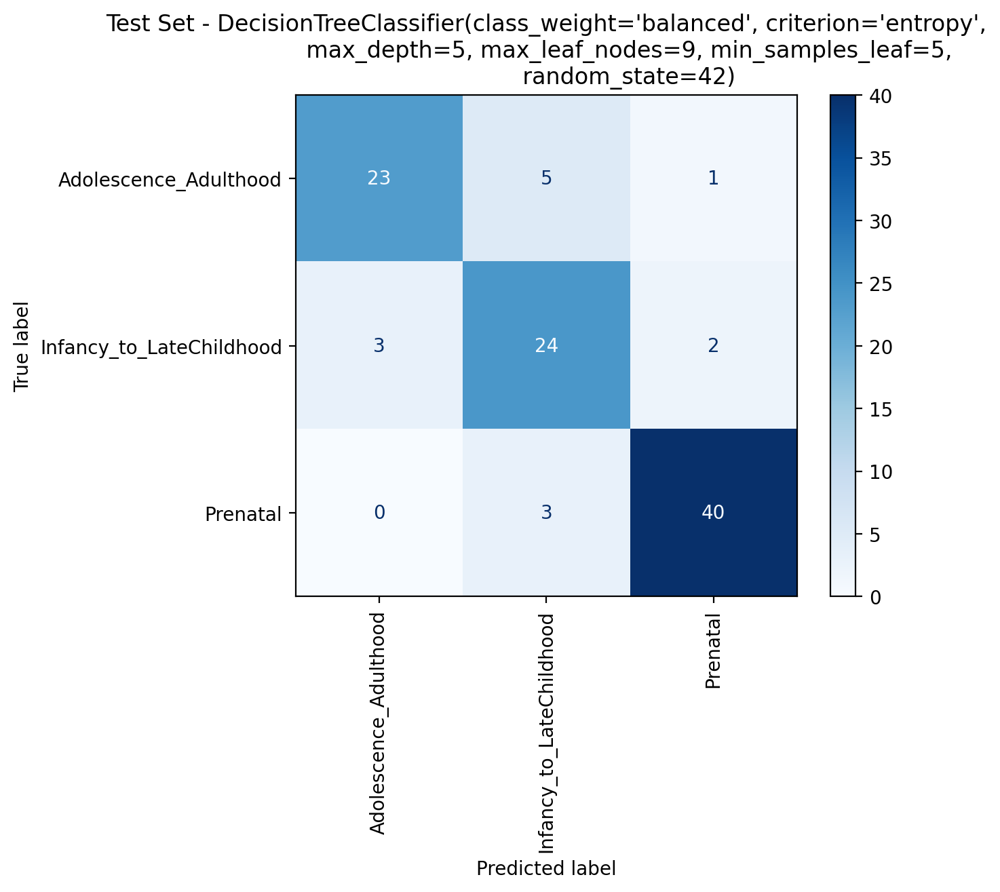

In [36]:
param_grid_dt = {'class_weight' : ['balanced'], 
                'criterion' : ['gini', 'entropy'],
                 'max_depth' : [1,3,5],
                 'max_leaf_nodes' : [3,7,9],
                 'min_samples_leaf' : [2,5,8]
                }
title_dt = 'Decision Tree : Grid Search'
dt_grid = grid_search_model(dt, param_grid_dt, title_dt,X_train,  y_train, X_test, y_test, cv)

It seems DT does not perform so brilliantly 🎄

Best Hyperparameters:  {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 3, 'max_leaf_nodes': 4, 'min_samples_leaf': 2, 'n_estimators': 100}

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.86      0.86      0.86       114
Infancy_to_LateChildhood       0.85      0.85      0.85       115
                Prenatal       0.99      0.99      0.99       172

                accuracy                           0.92       401
               macro avg       0.90      0.90      0.90       401
            weighted avg       0.92      0.92      0.92       401

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, max_leaf_nodes=4, min_samples_leaf=2,
                       random_state=42): F1 Score for Training Set: 0.915


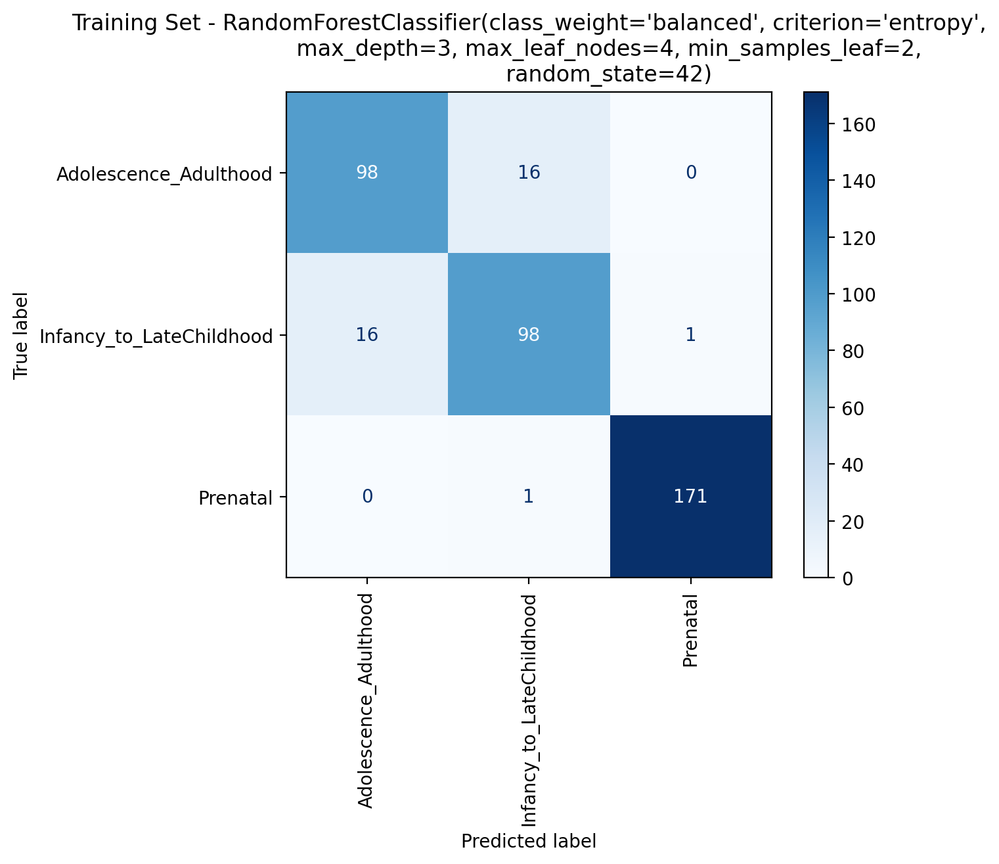

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.79      0.79      0.79        29
Infancy_to_LateChildhood       0.79      0.79      0.79        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.88       101
               macro avg       0.86      0.86      0.86       101
            weighted avg       0.88      0.88      0.88       101

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, max_leaf_nodes=4, min_samples_leaf=2,
                       random_state=42): F1 Score for Test Set: 0.881


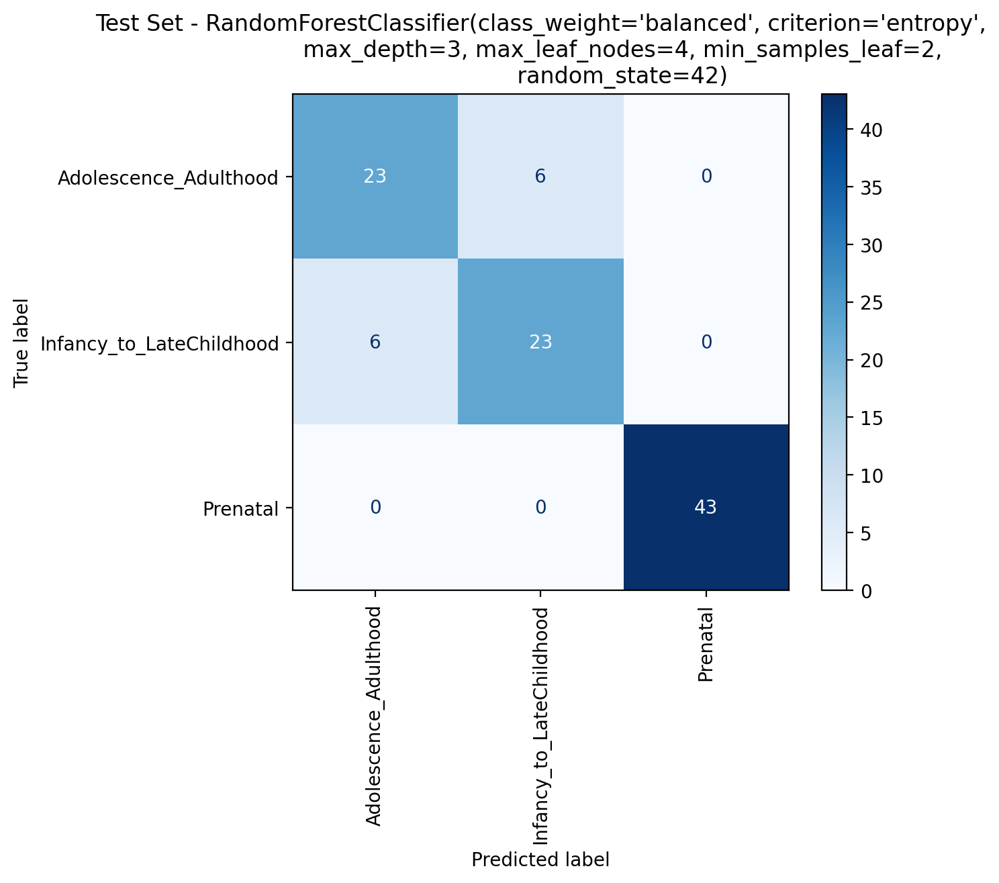

In [37]:
param_grid_rf = {'class_weight' : ['balanced'], 
                'n_estimators' : [20, 100],
                'criterion' : ['entropy', 'gini'],
                 'max_depth' : [1,3],
                 'max_leaf_nodes' : [3,4],
                 'min_samples_leaf' : [2,3]
                }
title_rf = 'Random Forest : Grid Search'
rf_grid = grid_search_model(rf, param_grid_rf, title_rf, X_train,  y_train, X_test, y_test, cv)

We can increase the number of trees but .. Not so good 🌴🎄🌳

#### Bagging Classifier 🧳👜
The Bagging Classifier, short for Bootstrap Aggregating, is a popular ensemble learning technique. It works by creating multiple subsets of the original dataset through random sampling with replacement (bootstrap sampling). Then, it trains a base classifier on each subset independently. During prediction, it aggregates the predictions from all base classifiers (usually through voting or averaging) to make the final prediction. Bagging helps reduce overfitting and improve the stability and accuracy of the model by leveraging the wisdom of the crowd

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       1.00      1.00      1.00       114
Infancy_to_LateChildhood       1.00      1.00      1.00       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           1.00       401
               macro avg       1.00      1.00      1.00       401
            weighted avg       1.00      1.00      1.00       401

BalancedBaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=3,
                                                              weights='distance')): F1 Score for Training Set: 1.000


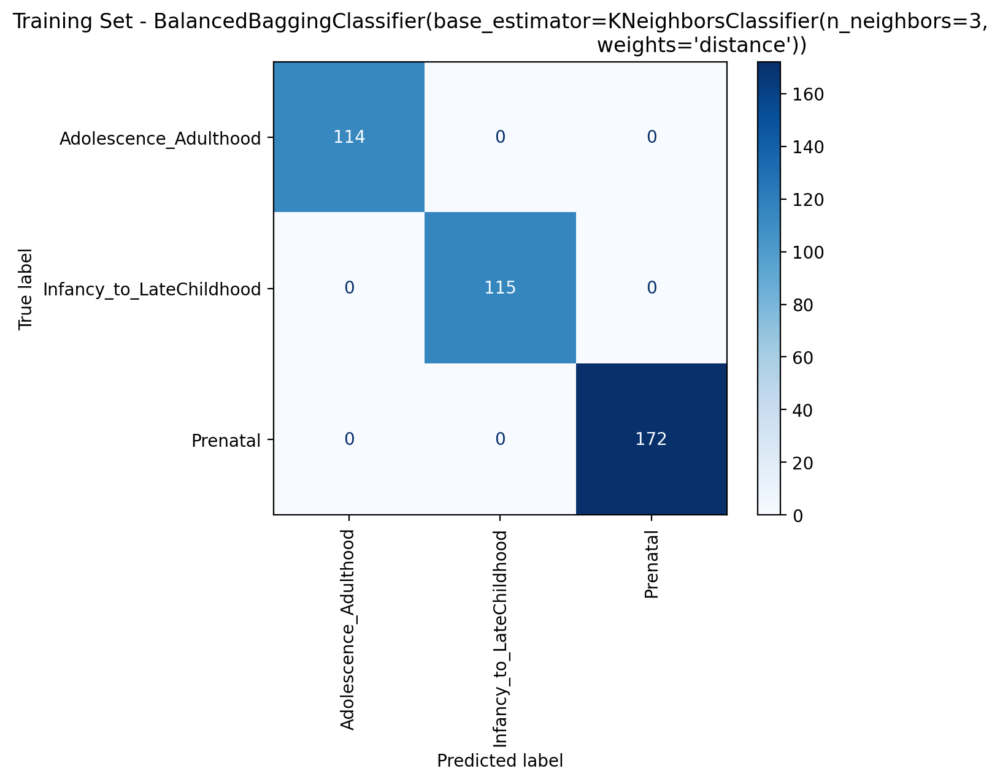

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.90      0.97      0.93        29
Infancy_to_LateChildhood       0.96      0.90      0.93        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.96       101
               macro avg       0.96      0.95      0.95       101
            weighted avg       0.96      0.96      0.96       101

BalancedBaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=3,
                                                              weights='distance')): F1 Score for Test Set: 0.960


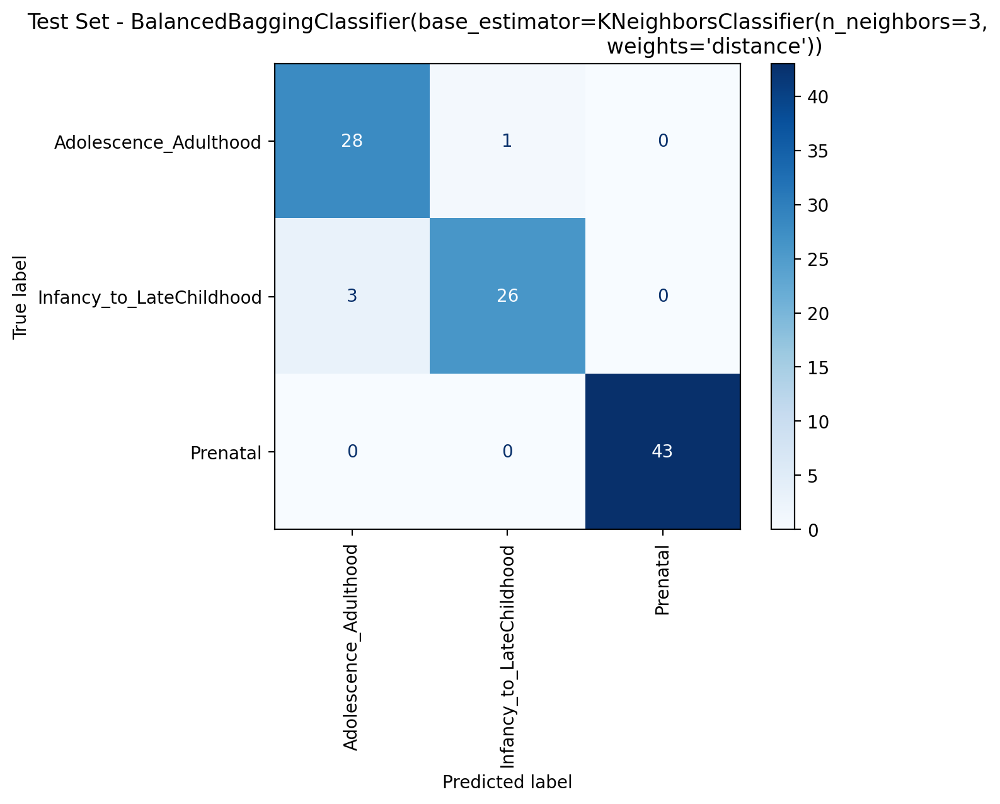

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.90      0.89      0.89       114
Infancy_to_LateChildhood       0.89      0.90      0.90       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.94       401
               macro avg       0.93      0.93      0.93       401
            weighted avg       0.94      0.94      0.94       401

BalancedBaggingClassifier(base_estimator=RandomForestClassifier(class_weight='balanced',
                                                                criterion='entropy',
                                                                max_depth=3,
                                                                max_leaf_nodes=4,
                                                                min_samples_leaf=2,
                                                                random_state=42)): F1 Score for Training

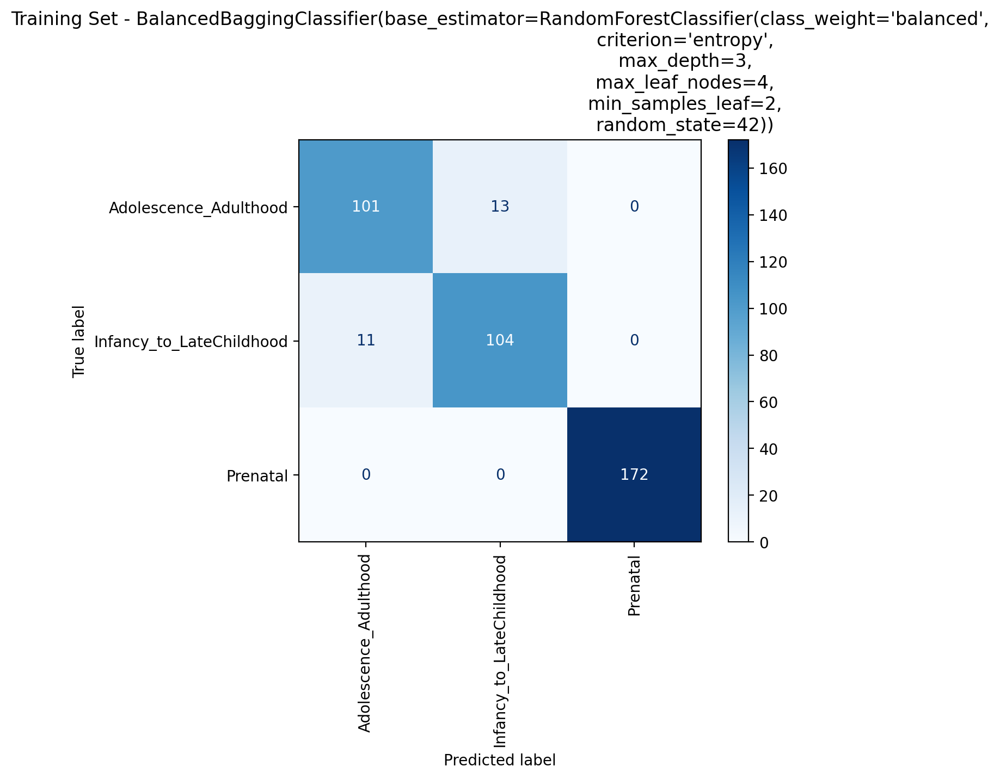

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.77      0.79      0.78        29
Infancy_to_LateChildhood       0.79      0.76      0.77        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.87       101
               macro avg       0.85      0.85      0.85       101
            weighted avg       0.87      0.87      0.87       101

BalancedBaggingClassifier(base_estimator=RandomForestClassifier(class_weight='balanced',
                                                                criterion='entropy',
                                                                max_depth=3,
                                                                max_leaf_nodes=4,
                                                                min_samples_leaf=2,
                                                                random_state=42)): F1 Score for Test Set: 0.

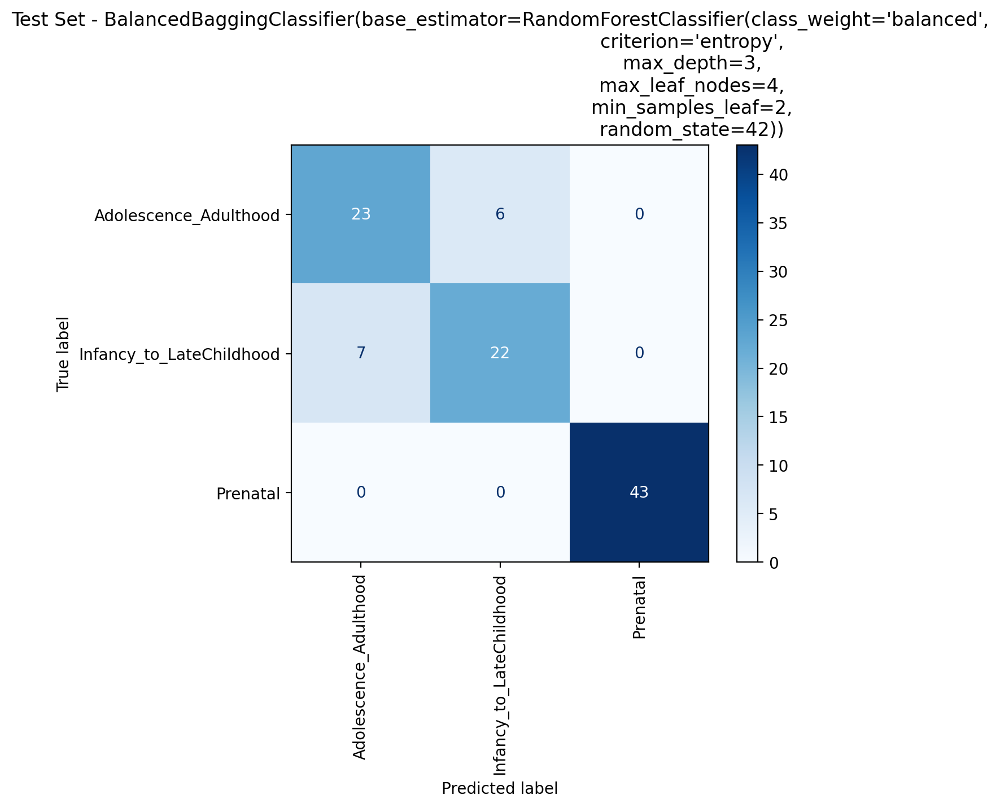

Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.89      0.90      0.90       114
Infancy_to_LateChildhood       0.90      0.89      0.89       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.94       401
               macro avg       0.93      0.93      0.93       401
            weighted avg       0.94      0.94      0.94       401

BalancedBaggingClassifier(base_estimator=SVC(C=0.1, class_weight='balanced',
                                             kernel='linear',
                                             probability=True)): F1 Score for Training Set: 0.940


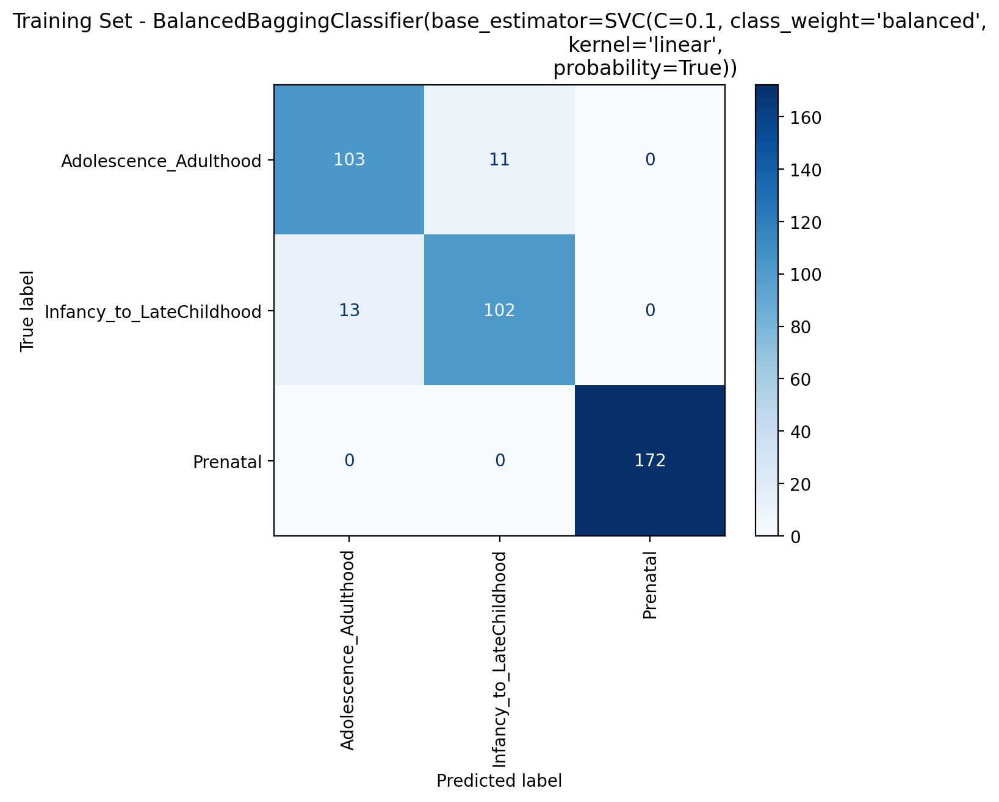

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.84      0.90      0.87        29
Infancy_to_LateChildhood       0.89      0.83      0.86        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.92       101
               macro avg       0.91      0.91      0.91       101
            weighted avg       0.92      0.92      0.92       101

BalancedBaggingClassifier(base_estimator=SVC(C=0.1, class_weight='balanced',
                                             kernel='linear',
                                             probability=True)): F1 Score for Test Set: 0.921


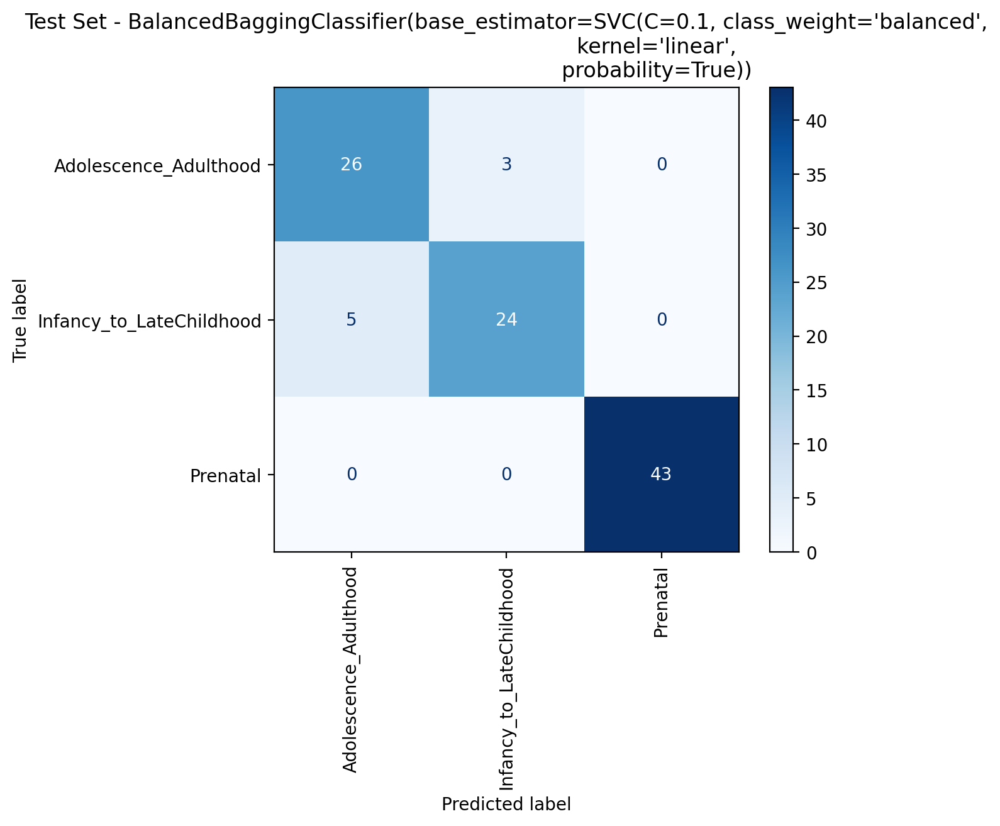

In [38]:
def bagging_model(model, title, X_train, y_train, X_test, y_test):
    bb_model = BalancedBaggingClassifier(base_estimator = model)
    bb_model.fit(X_train, y_train)
    y_train_pred= bb_model.predict(X_train)
    y_test_pred = bb_model.predict(X_test)

    print_results(bb_model, title, y_train, y_train_pred, y_test, y_test_pred)
    
    return bb_model, y_test_pred

title_knn = 'KNN: Balanced Bagging'
knn_bb, y_pred_knn_bb = bagging_model(knn_grid, title_knn, X_train, y_train, X_test, y_test)

title_rf = 'Random Forest: Balanced Bagging'
rf_bb, y_pred_rf_bb = bagging_model(rf_grid, title_rf, X_train, y_train, X_test, y_test)

title_svc = 'SVC: BalancedBagging'
svc_bb, y_pred_svc_bb = bagging_model(svc_grid, title_svc, X_train, y_train, X_test, y_test)

##### Voting Classifier 👨🏻‍🏫
The VotingClassifier is another ensemble learning method that combines the predictions of multiple base estimators (classifiers) and aggregates them to make a final prediction. It supports two types of voting: hard voting and soft voting. In hard voting, the final prediction is based on the majority class predicted by the individual classifiers. In soft voting, the final prediction is based on the average probability predicted by the classifiers for each class. This approach leverages the wisdom of the crowd to make more accurate predictions than any single base estimator on its own.

In [39]:
def ensemble_voting(classifiers, X_train, y_train, X_test, y_test):
    best_model_voting = None
    best_f1_score = 0
    y_pred_best = None
    y_train_pred_best = None
    selected_classifiers = []
    
    for i in range(len(classifiers)):
        for j in range(i+1, len(classifiers)):
            clf1 = classifiers[i]
            clf2 = classifiers[j]
            
            
            # Create the VotingClassifier with hard voting
            voting_clf_hard = VotingClassifier(estimators=[('clf1', clf1), ('clf2', clf2)], voting='hard')
            voting_clf_hard.fit(X_train, y_train)
            y_pred_hard = voting_clf_hard.predict(X_test)
            f1_hard = f1_score(y_test, y_pred_hard, average='weighted')  # Choose an appropriate average value

            # Create the VotingClassifier with soft voting
            voting_clf_soft = VotingClassifier(estimators=[('clf1', clf1), ('clf2', clf2)], voting='soft')
            voting_clf_soft.fit(X_train, y_train)
            y_pred_soft = voting_clf_soft.predict(X_test)
            f1_soft = f1_score(y_test, y_pred_soft, average='weighted')  # Choose an appropriate average value

            # Check if the F1 score is better than the current best
            if f1_hard > best_f1_score:
                best_model_voting = voting_clf_hard
                best_f1_score = f1_hard
                y_pred_best = y_pred_hard
                y_train_pred_best = voting_clf_hard.predict(X_train)
                selected_classifiers = [type(clf1).__name__, type(clf2).__name__]

            if f1_soft > best_f1_score:
                best_model_voting = voting_clf_soft
                best_f1_score = f1_soft
                y_pred_best = y_pred_soft
                y_train_pred_best = voting_clf_hard.predict(X_train)
                selected_classifiers = [type(clf1).__name__, type(clf2).__name__]
    
    print("Selected classifiers for best model voting:", selected_classifiers)
    
    print_results(best_model_voting, 'Voting Classifier', y_train, y_train_pred_best, y_test, y_pred_best)
    return best_model_voting, y_pred_best


Selected classifiers for best model voting: ['SVC', 'KNeighborsClassifier']
Training Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.90      1.00      0.95       114
Infancy_to_LateChildhood       1.00      0.90      0.94       115
                Prenatal       1.00      1.00      1.00       172

                accuracy                           0.97       401
               macro avg       0.97      0.97      0.96       401
            weighted avg       0.97      0.97      0.97       401

VotingClassifier(estimators=[('clf1',
                              SVC(C=0.1, class_weight='balanced',
                                  kernel='linear', probability=True)),
                             ('clf2',
                              KNeighborsClassifier(n_neighbors=3,
                                                   weights='distance'))],
                 voting='soft'): F1 Score for Training Set: 0.970


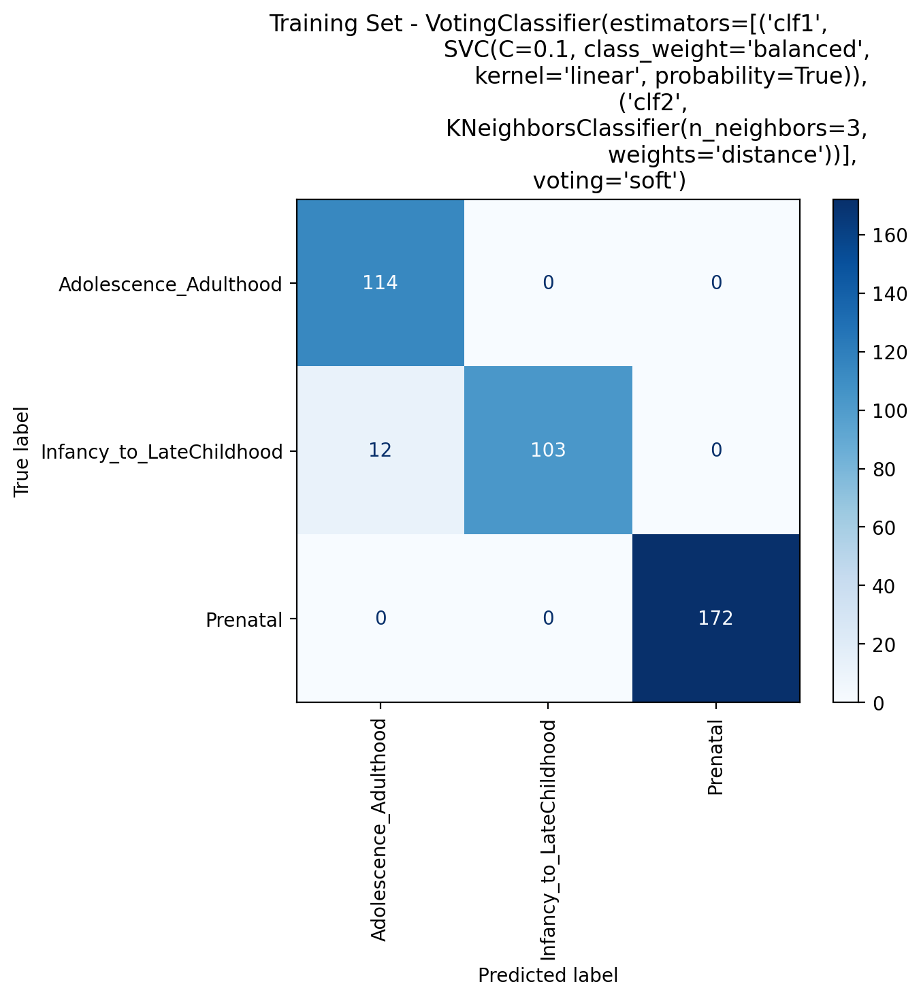

Test Set:
                          precision    recall  f1-score   support

   Adolescence_Adulthood       0.93      0.97      0.95        29
Infancy_to_LateChildhood       0.96      0.93      0.95        29
                Prenatal       1.00      1.00      1.00        43

                accuracy                           0.97       101
               macro avg       0.97      0.97      0.97       101
            weighted avg       0.97      0.97      0.97       101

VotingClassifier(estimators=[('clf1',
                              SVC(C=0.1, class_weight='balanced',
                                  kernel='linear', probability=True)),
                             ('clf2',
                              KNeighborsClassifier(n_neighbors=3,
                                                   weights='distance'))],
                 voting='soft'): F1 Score for Test Set: 0.970


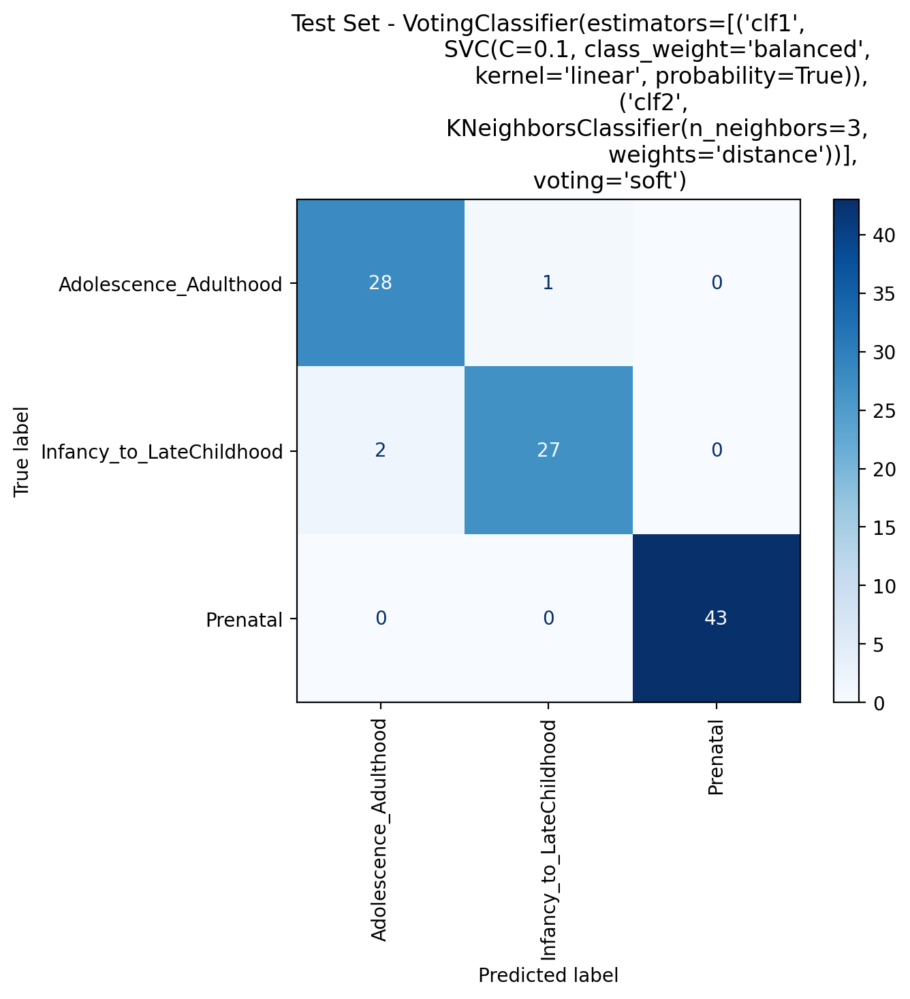

In [40]:
classifiers = [rf_grid, rf_bb, svc_grid, svc_bb, knn_grid, knn_bb]
best_model_voting, y_pred_model_voting = ensemble_voting(classifiers, X_train, y_train, X_test, y_test)

In [3]:
# you can save your model!
joblib.dump(best_model_voting,'VotingClf.pkl' )

#### XGBOOST 🏎💨
XGBoost (Extreme Gradient Boosting) is an optimized gradient boosting algorithm designed to be highly efficient, flexible, and scalable. It belongs to the family of ensemble learning techniques and works by sequentially adding decision trees to correct the errors of previous models. Each subsequent tree is built to minimize the overall loss function of the ensemble. XGBoost uses a gradient descent optimization algorithm to update the model parameters at each iteration, resulting in faster convergence and better performance. It also incorporates regularization techniques to prevent overfitting and improve generalization. XGBoost has become a popular choice for structured/tabular data and is widely used in data science competitions and real-world applications due to its superior performance and versatility.

In [42]:
label_encoder = LabelEncoder()

y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)


params = {
    'objective': 'multi:softmax',  # 'multi:softmax' for multiclass clf
    'num_class': len(label_encoder.classes_),  # number of classes
    'max_depth': 3,
    'learning_rate': 0.01,
    'subsample': 0.7,
    'colsample_bytree': 0.8,
    'n_estimators': 100
}


xgb_ = xgb.XGBClassifier(**params)


eval_set = [(X_train, y_train_encoded), (X_test, y_test_encoded)]

xgb_.fit(
    X_train, y_train_encoded,
    eval_metric=["mlogloss", "merror"],
    eval_set=eval_set,
    early_stopping_rounds=20,  # Stopping step
    verbose=True
)

[0]	validation_0-mlogloss:1.08619	validation_0-merror:0.03990	validation_1-mlogloss:1.08758	validation_1-merror:0.09901
[1]	validation_0-mlogloss:1.07395	validation_0-merror:0.03990	validation_1-mlogloss:1.07700	validation_1-merror:0.06931
[2]	validation_0-mlogloss:1.06172	validation_0-merror:0.03242	validation_1-mlogloss:1.06657	validation_1-merror:0.07921
[3]	validation_0-mlogloss:1.04991	validation_0-merror:0.02743	validation_1-mlogloss:1.05598	validation_1-merror:0.07921
[4]	validation_0-mlogloss:1.03848	validation_0-merror:0.02494	validation_1-mlogloss:1.04561	validation_1-merror:0.06931
[5]	validation_0-mlogloss:1.02724	validation_0-merror:0.02494	validation_1-mlogloss:1.03566	validation_1-merror:0.06931
[6]	validation_0-mlogloss:1.01594	validation_0-merror:0.02244	validation_1-mlogloss:1.02576	validation_1-merror:0.06931
[7]	validation_0-mlogloss:1.00561	validation_0-merror:0.02494	validation_1-mlogloss:1.01722	validation_1-merror:0.07921
[8]	validation_0-mlogloss:0.99523	valida

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_class=3,
              num_parallel_tree=None, objective='multi:softmax', ...)

Training Set:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       114
           1       0.93      0.93      0.93       115
           2       0.99      0.99      0.99       172

    accuracy                           0.96       401
   macro avg       0.95      0.95      0.95       401
weighted avg       0.96      0.96      0.96       401

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monoton

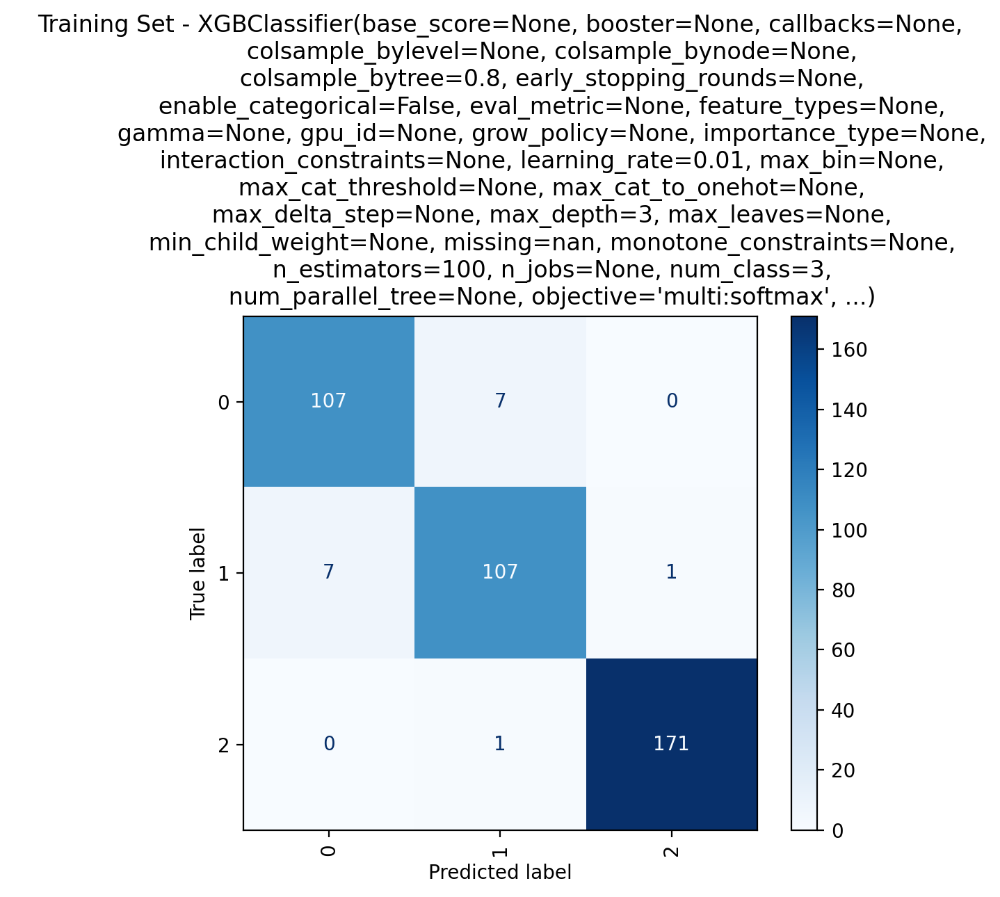

Test Set:
              precision    recall  f1-score   support

           0       0.87      0.90      0.88        29
           1       0.89      0.86      0.88        29
           2       1.00      1.00      1.00        43

    accuracy                           0.93       101
   macro avg       0.92      0.92      0.92       101
weighted avg       0.93      0.93      0.93       101

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_co

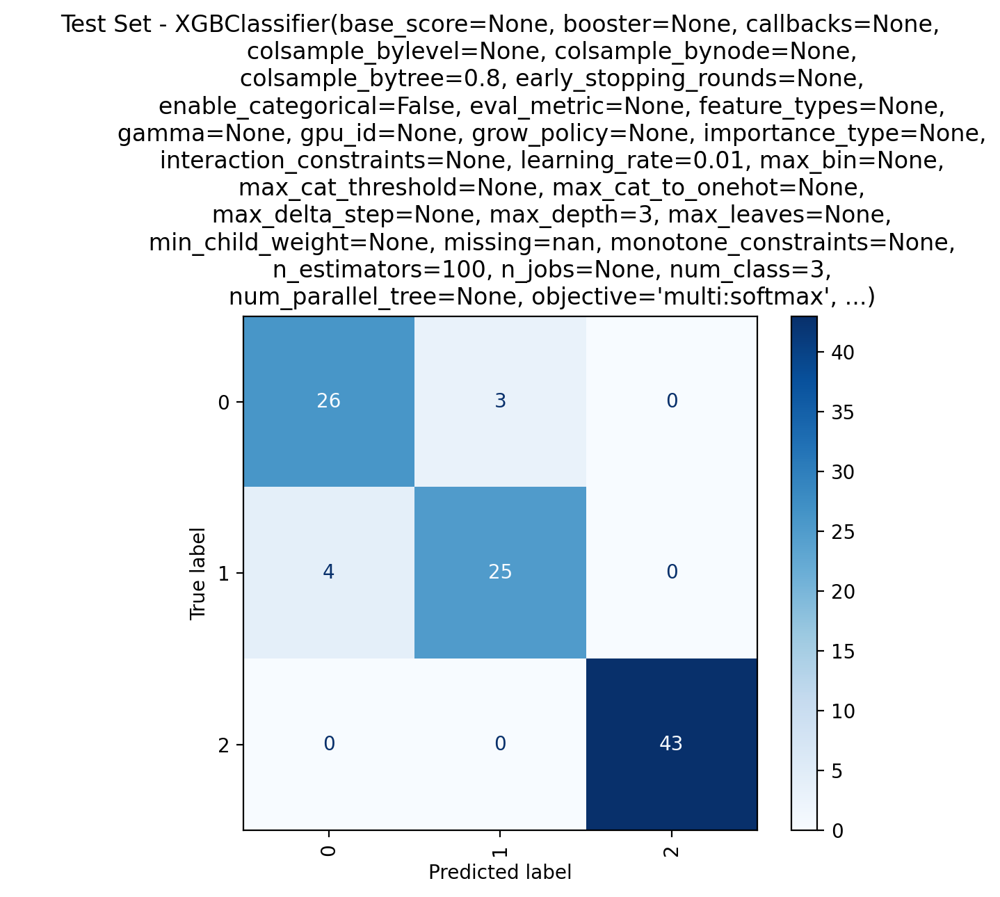

In [43]:
y_test_encoded = y_test.replace({})
y_train_pred = xgb_.predict(X_train)
# Fai previsioni sui dati di test
y_test_pred = xgb_.predict(X_test)
title = None

print_results(xgb_, title, y_train_encoded, y_train_pred, y_test_encoded, y_test_pred)


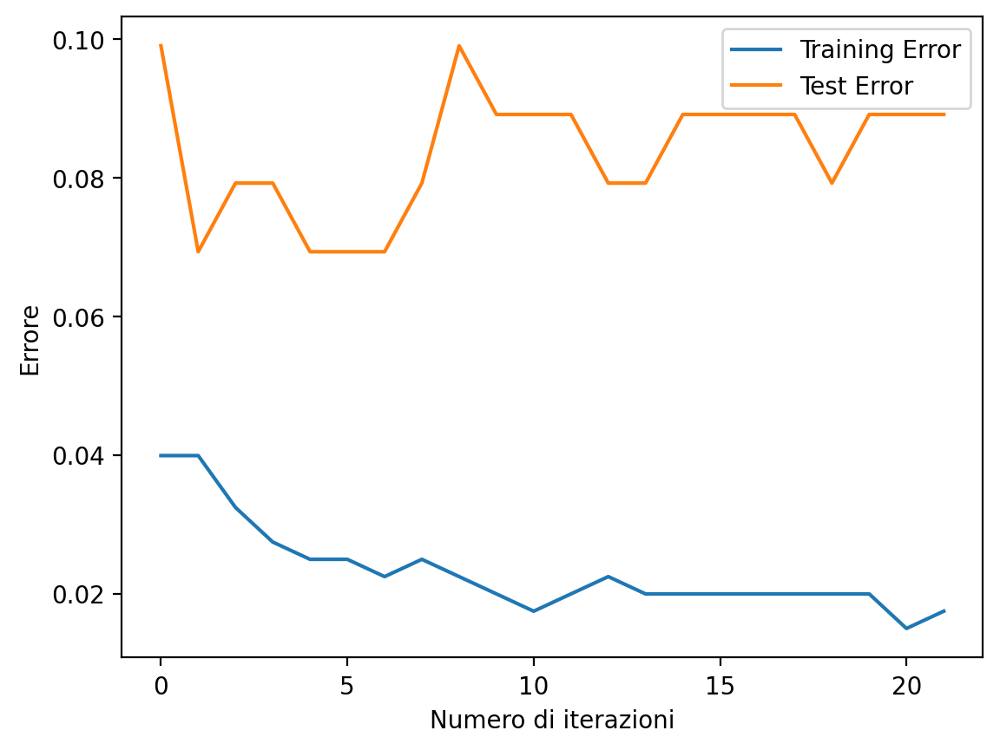

In [44]:

results = xgb_.evals_result()


train_error = results['validation_0']['merror']
test_error = results['validation_1']['merror']

plt.plot(train_error, label='Training Error')
plt.plot(test_error, label='Test Error')
plt.xlabel('Numero di iterazioni')
plt.ylabel('Errore')
plt.legend()
plt.show()


#### Hyperparmeters tuning for XGB

Best Hyperparameters:  {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'num_class': 3, 'objective': 'multi:softmax', 'subsample': 0.7}

Training Set:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       114
           1       0.95      0.97      0.96       115
           2       1.00      1.00      1.00       172

    accuracy                           0.98       401
   macro avg       0.97      0.97      0.97       401
weighted avg       0.98      0.98      0.98       401

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
            

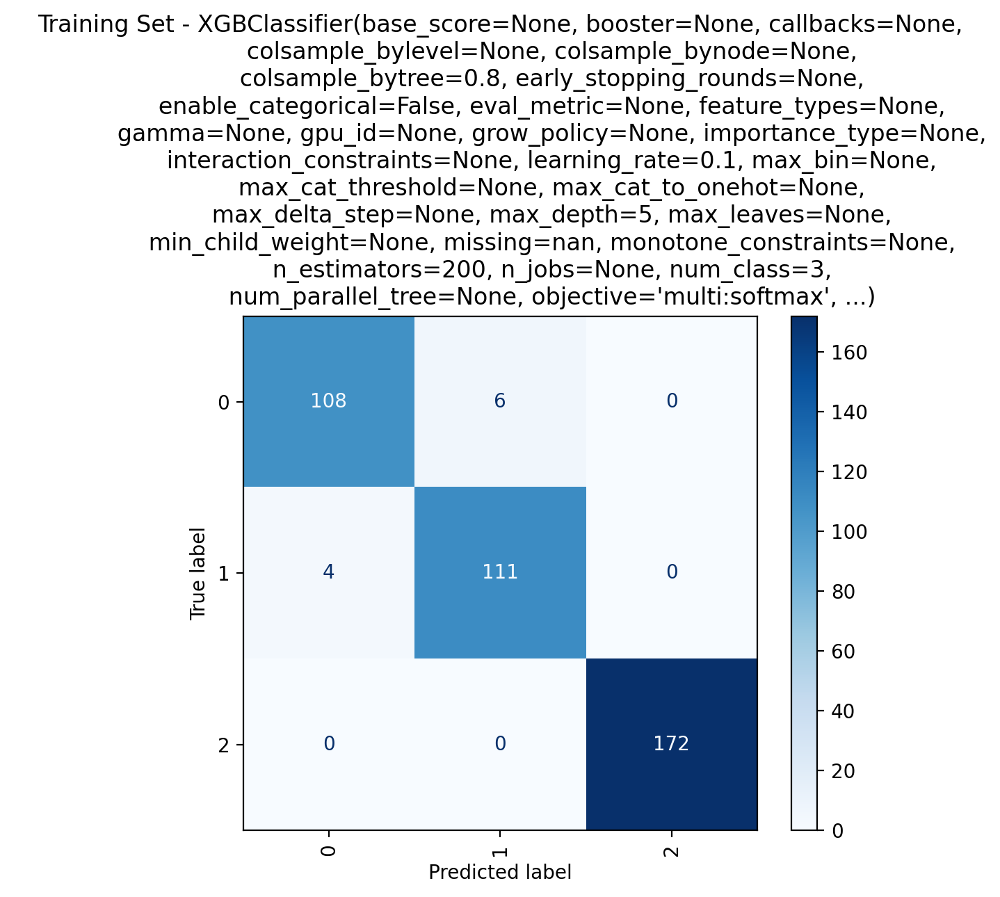

Test Set:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93        29
           1       0.90      0.97      0.93        29
           2       1.00      1.00      1.00        43

    accuracy                           0.96       101
   macro avg       0.96      0.95      0.95       101
weighted avg       0.96      0.96      0.96       101

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_con

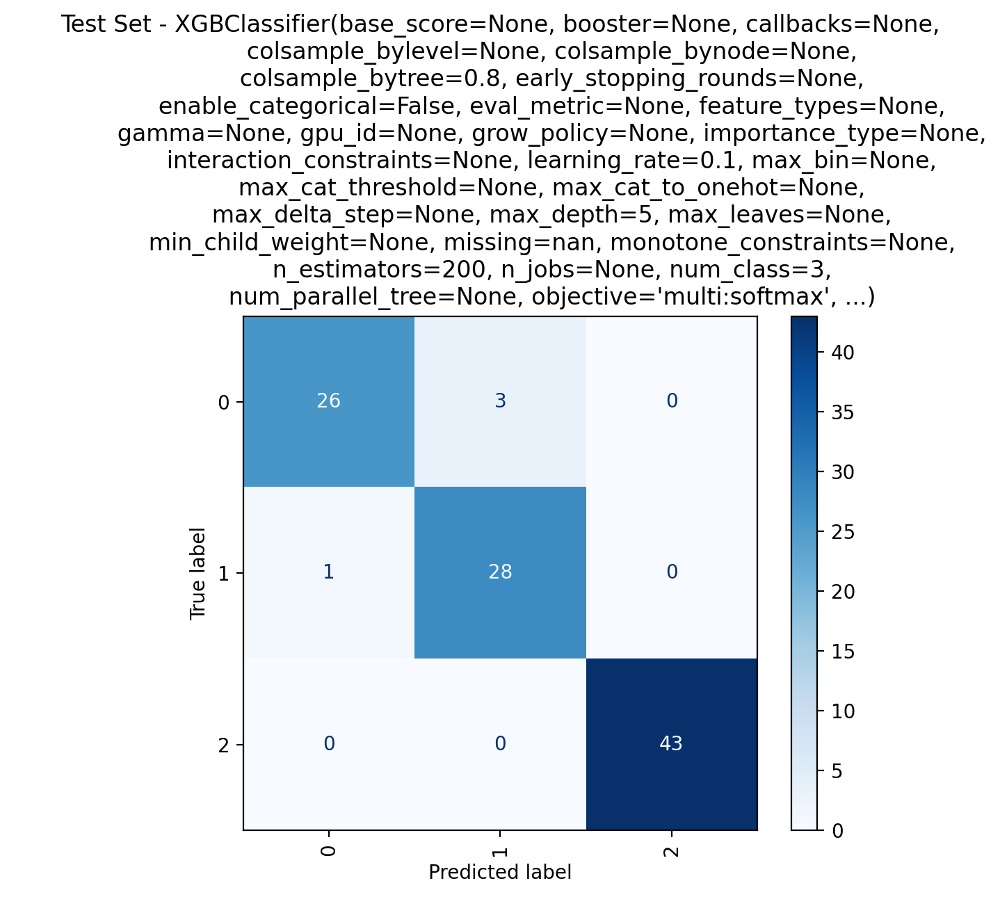

In [70]:
param_grid_xgb = {
    'objective': ['multi:softmax','multi:sofprob'],  
    'num_class': [len(label_encoder.classes_)],
    'max_depth': [5],
    'learning_rate': [0.1, 0.01],
    'n_estimators': [100,200],
    'subsample': [0.7],
    'colsample_bytree': [0.8,1],
    #'reg_alpha': [0, 0.1, 0.5],
    #'reg_lambda': [0, 0.1, 0.5]
}

title_xgb = None
xgb_grid = grid_search_model(xgb_, param_grid_xgb, title_xgb,X_train,  y_train_encoded, X_test, y_test_encoded, cv)

[0]	validation_0-mlogloss:0.97247	validation_0-merror:0.02743	validation_1-mlogloss:0.99055	validation_1-merror:0.08911
[1]	validation_0-mlogloss:0.86532	validation_0-merror:0.01247	validation_1-mlogloss:0.89996	validation_1-merror:0.08911
[2]	validation_0-mlogloss:0.77327	validation_0-merror:0.00998	validation_1-mlogloss:0.82075	validation_1-merror:0.08911
[3]	validation_0-mlogloss:0.69284	validation_0-merror:0.00499	validation_1-mlogloss:0.75181	validation_1-merror:0.07921
[4]	validation_0-mlogloss:0.62474	validation_0-merror:0.00499	validation_1-mlogloss:0.69121	validation_1-merror:0.04950
[5]	validation_0-mlogloss:0.56268	validation_0-merror:0.00249	validation_1-mlogloss:0.63591	validation_1-merror:0.04950
[6]	validation_0-mlogloss:0.50865	validation_0-merror:0.00000	validation_1-mlogloss:0.58852	validation_1-merror:0.04950
[7]	validation_0-mlogloss:0.46261	validation_0-merror:0.00000	validation_1-mlogloss:0.54998	validation_1-merror:0.03960
[8]	validation_0-mlogloss:0.42142	valida

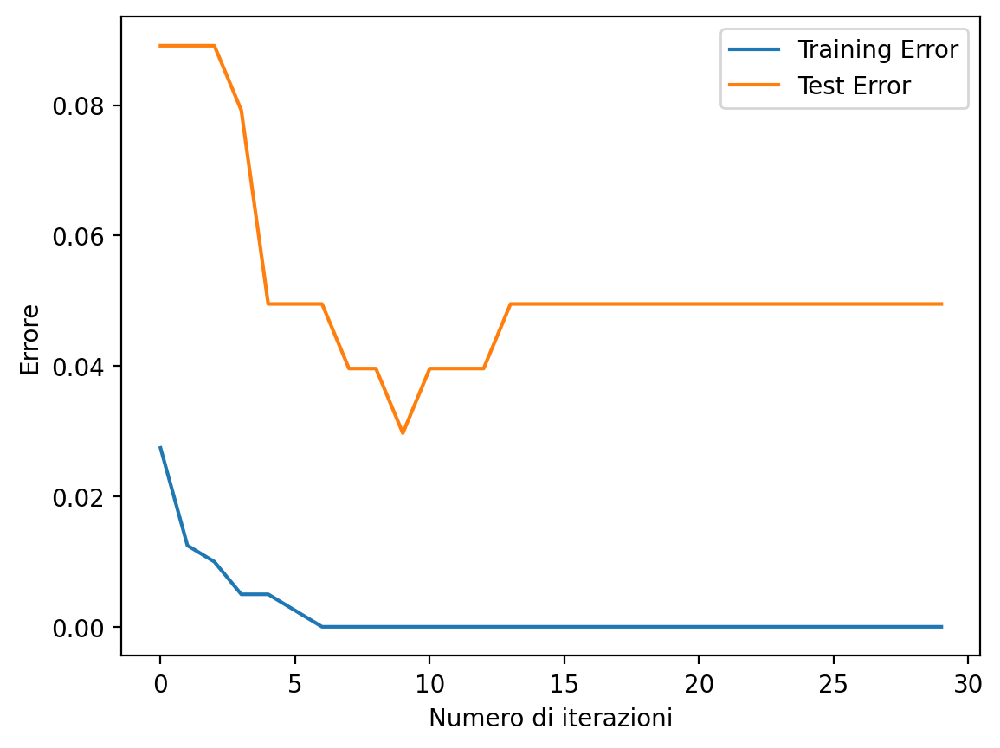

In [83]:
plt.figure()
xgb_grid.fit(
    X_train, y_train_encoded,
    eval_metric=["mlogloss", "merror"],
    eval_set=eval_set,
    early_stopping_rounds=20,  # Imposta il numero di iterazioni senza miglioramenti prima dell'arresto
    verbose=True
)

# Estrai le metriche di valutazione
results = xgb_grid.evals_result()

# Estrai le metriche di training e test
train_error = results['validation_0']['merror']
test_error = results['validation_1']['merror']

# Plotta l'andamento dell'errore
plt.plot(train_error, label='Training Error')
plt.plot(test_error, label='Test Error')
plt.xlabel('Numero di iterazioni')
plt.ylabel('Errore')
plt.legend()


plt.savefig('XGB metric evaluation.png')
plt.show()

Notably, it appeared that during the training session the model exhibited substantial
“learning activity” up to the 20 iteration, after which a plateau was observed for both
training and testing sessions. 

In [2]:
joblib.dump(xgb_grid,'xgb_grid.pkl' )

### AUC-ROC 📉
The Area Under the Curve (AUC) is a metric used to evaluate the performance of a binary classification model. Neverheless, we want to show you how much good our model perfomrs.

It represents the area under the Receiver Operating Characteristic (ROC) curve, which is a graphical plot that illustrates the trade-off between the true positive rate (sensitivity) and the false positive rate (1 - specificity) at various threshold settings.

In simple terms, the AUC measures the model's ability to distinguish between positive and negative classes. A higher AUC value (closer to 1) indicates better discrimination, meaning the model has a higher chance of ranking a randomly chosen positive instance higher than a randomly chosen negative instance. Conversely, an AUC value close to 0.5 suggests that the model performs no better than random guessing.

In [65]:
def AUC_ROC(model, X_test, y_test,title, micro=False, macro=False, save_fig=False):
    y_test_encoded = label_encoder.transform(y_test)


    y_true = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))

    y_probabilities = model.predict_proba(X_test)

    n_classes = y_true.shape[1]

    # Calculate ROC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_probabilities[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    if micro:
        
        fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_probabilities.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    if macro:

        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        mean_tpr = np.zeros_like(all_fpr)

        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


    auc_roc = roc_auc_score(y_true, y_probabilities, multi_class='ovr')
    print(f'AUC-ROC: {auc_roc}')
    

    plt.figure(figsize=(8, 6))

    colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

    if micro:
      
        plt.plot(fpr["micro"], tpr["micro"],
                 label=f'ROC curve micro-average (area = {roc_auc["micro"]:.2f})',
                 color='deeppink', linestyle=':', linewidth=4)

    if macro:

        plt.plot(fpr["macro"], tpr["macro"],
                 label=f'ROC curve macro-average (area = {roc_auc["macro"]:.2f})',
                 color='navy', linestyle=':', linewidth=4)

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{title}')
    plt.legend(loc="lower right")


    classes_map = dict(zip(range(len(label_encoder.classes_)), label_encoder.classes_))

    label_0 = classes_map[0]
    label_1 = classes_map[1]
    label_2 = classes_map[2]


    plt.text(1.05, 0.5, f'Class 0: {label_0}', transform=plt.gca().transAxes, va='center', ha='left')
    plt.text(1.05, 0.45, f'Class 1: {label_1}', transform=plt.gca().transAxes, va='center', ha='left')
    plt.text(1.05, 0.4, f'Class 2: {label_2}', transform=plt.gca().transAxes, va='center', ha='left')



    if save_fig:
        fig_name = input('Choose the name to save the AUC-ROC: ')
        plt.savefig(f'{fig_name}.png')
        print(f'AUC-ROC saved as {fig_name}.png')
    
    plt.show()
    return



AUC-ROC: 0.9893039591315453
Choose the name to save the AUC-ROC: AUC-ROC XGB_grid
AUC-ROC saved as AUC-ROC XGB_grid.png


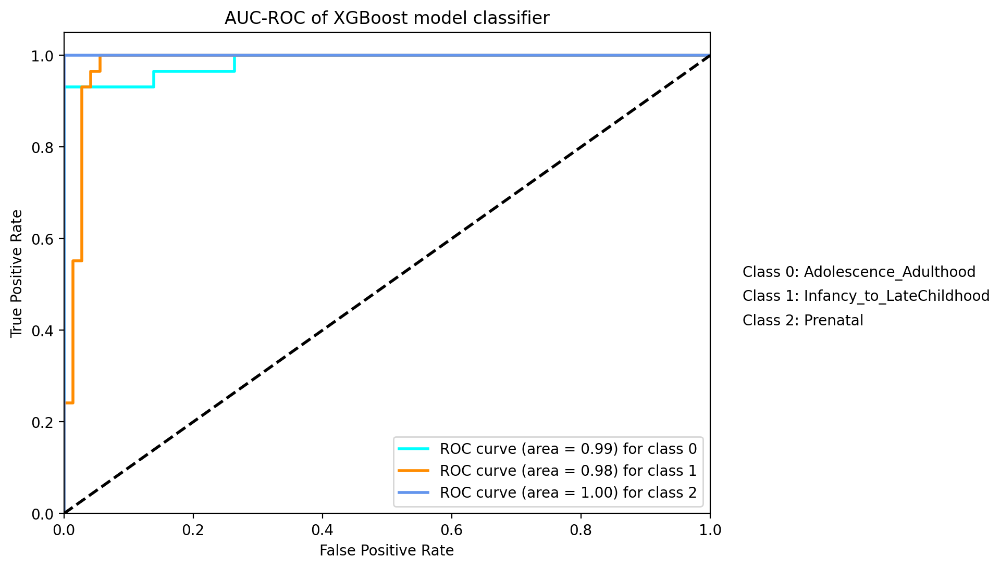

In [68]:
title = 'AUC-ROC of XGBoost model classifier'
AUC_ROC(xgb_grid, X_test, y_test, title, micro=False, macro = False, save_fig = False)

AUC-ROC: 0.9953703703703703
Choose the name to save the AUC-ROC: AUC-ROC Voting Clf
AUC-ROC saved as AUC-ROC Voting Clf.png


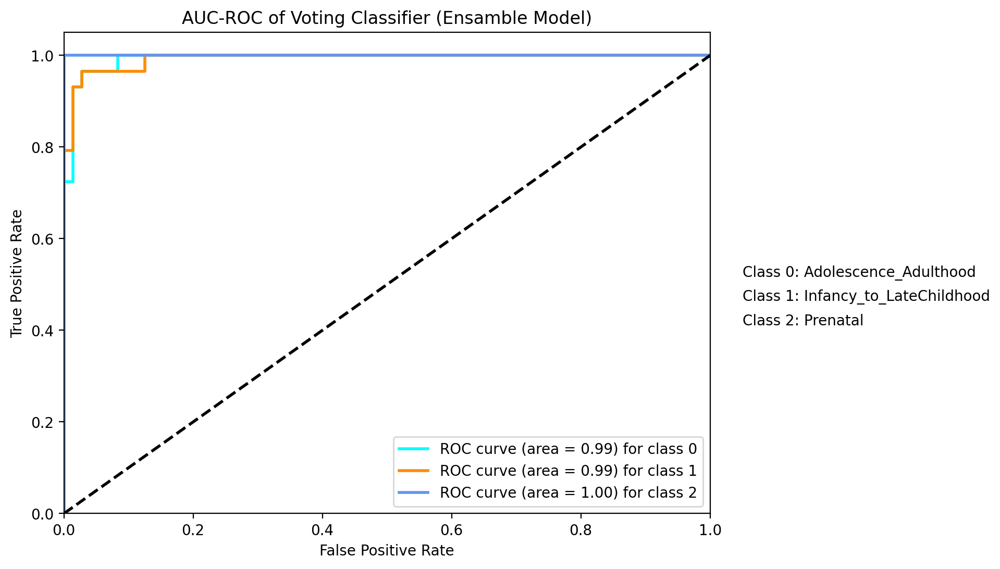

In [71]:
title = 'AUC-ROC of Voting Classifier (Ensamble Model)'
AUC_ROC(best_model_voting, X_test, y_test, title, micro=False, macro = False, save_fig = False)

The curve's proximity to the upper-left corner indicates the model's robust ability to
discriminate between different age groups, displaying commendable performance. 🥸

### Feature Importance 👑

The SHAP (SHapley Additive exPlanations) library is a popular tool for explaining the output of machine learning models. It's based on game theory concepts, specifically the Shapley values, which originate from cooperative game theory. 🏆

Here's how the SHAP library works and why it's useful:

_Explainability_: The SHAP library provides a unified framework for explaining the output of any machine learning model, regardless of its complexity or the nature of the features involved. It offers both global and local explanations, allowing users to understand how individual predictions are made and how different features contribute to model outcomes.

_Interpretability_: SHAP values provide intuitive explanations by quantifying the impact of each feature on the model's predictions. By analyzing these values, users can gain insights into which features are most influential and how they affect the model's decision-making process.

_Feature Importance_: SHAP values offer a nuanced understanding of feature importance. Unlike traditional methods that assign a single importance score to each feature, SHAP values provide a detailed breakdown of feature contributions for each prediction, taking into account interactions between features.

_Model Debugging_: The SHAP library can help diagnose model errors and biases by identifying instances where the model's predictions deviate significantly from expectations. By examining the SHAP values associated with problematic predictions, users can pinpoint the root causes of errors and take corrective actions.

_Model Comparison_: SHAP values facilitate model comparison by providing a standardized way to evaluate and compare the contributions of different models' features. This can be particularly useful when selecting the best-performing model for a specific task or when assessing the robustness of different modeling approaches.

In [17]:
import shap
import joblib

In [13]:
#load your model if you saved before
xgb_grid = joblib.load('xgb_grid.pkl' )

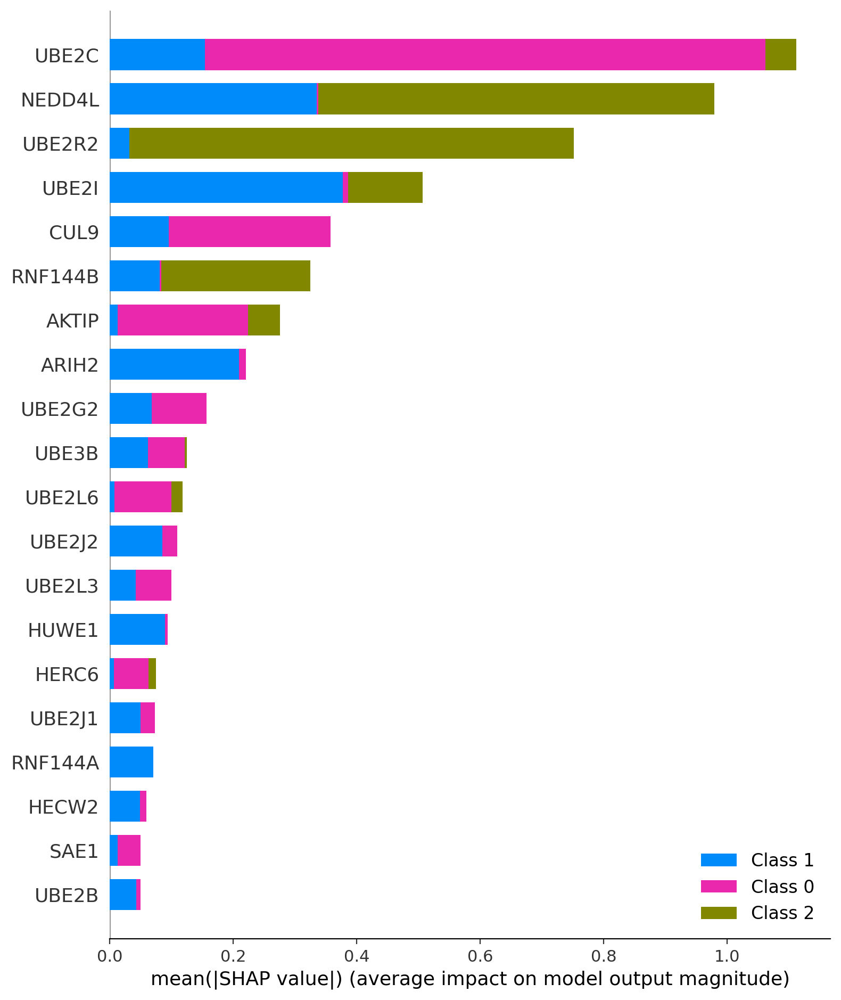

In [72]:
predictions = xgb_grid.predict(X_test)

explainer = shap.TreeExplainer(xgb_grid)


shap_values = explainer.shap_values(X_test, check_additivity=False)


feature_labels = X.columns


shap.summary_plot(shap_values, X_test, feature_names=feature_labels)
plt.show()

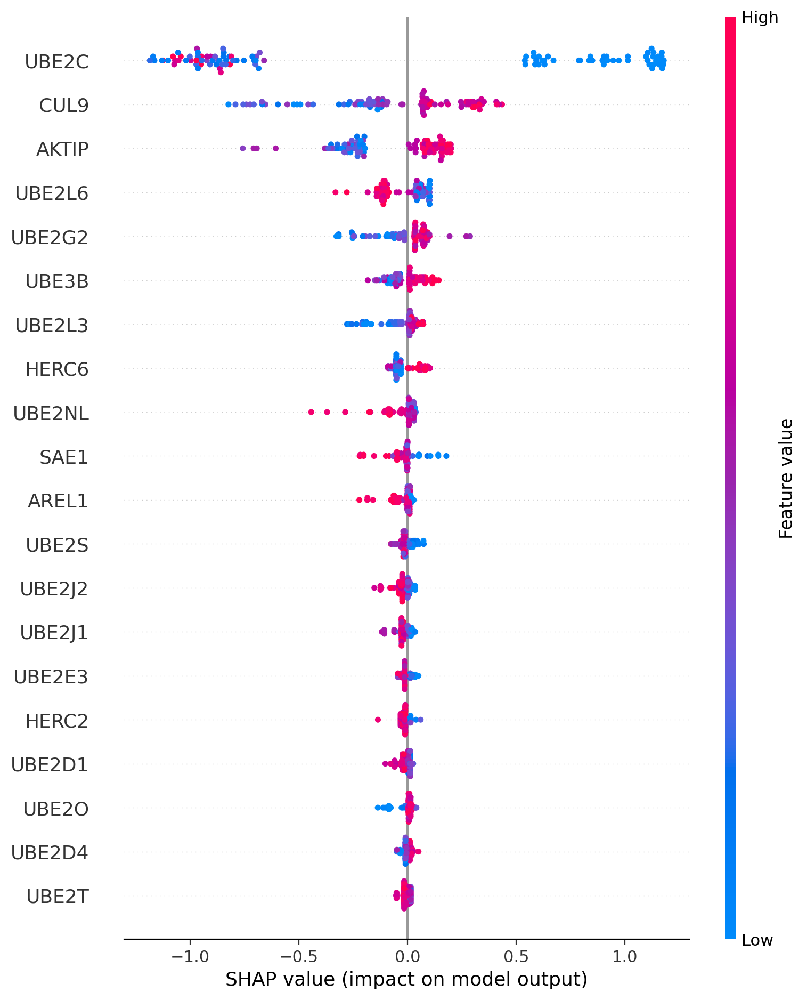

In [73]:
shap.summary_plot(shap_values[0], X_test, feature_names=feature_labels)

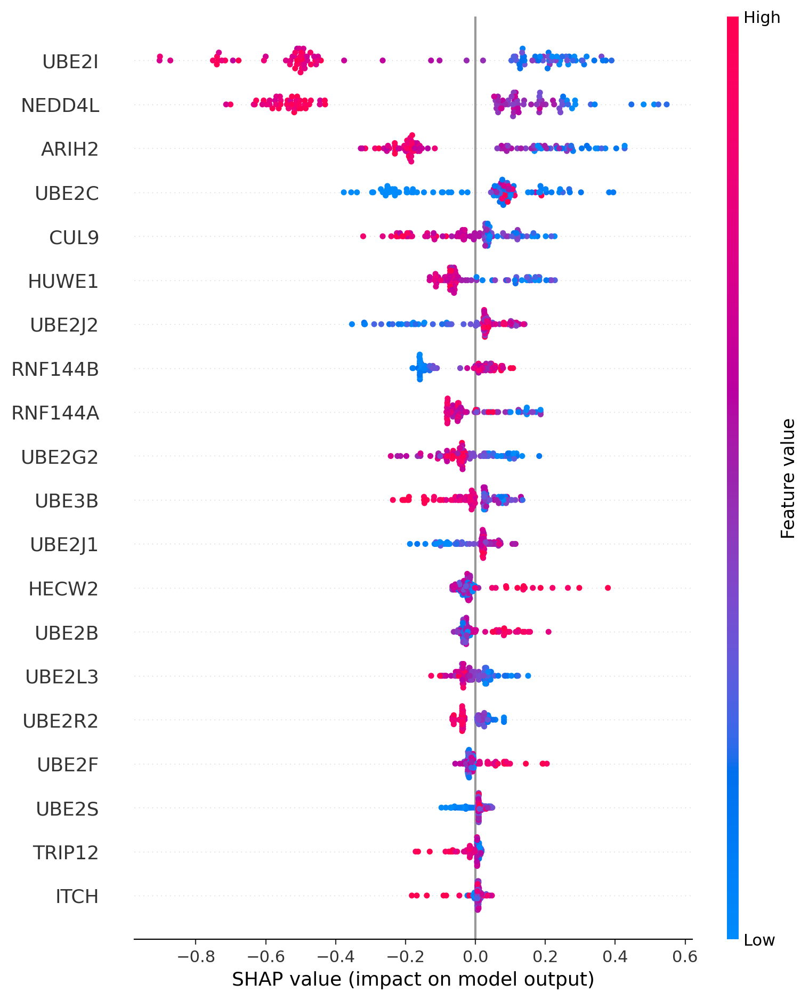

In [102]:
shap.summary_plot(shap_values[1], X_test, feature_names=feature_labels)

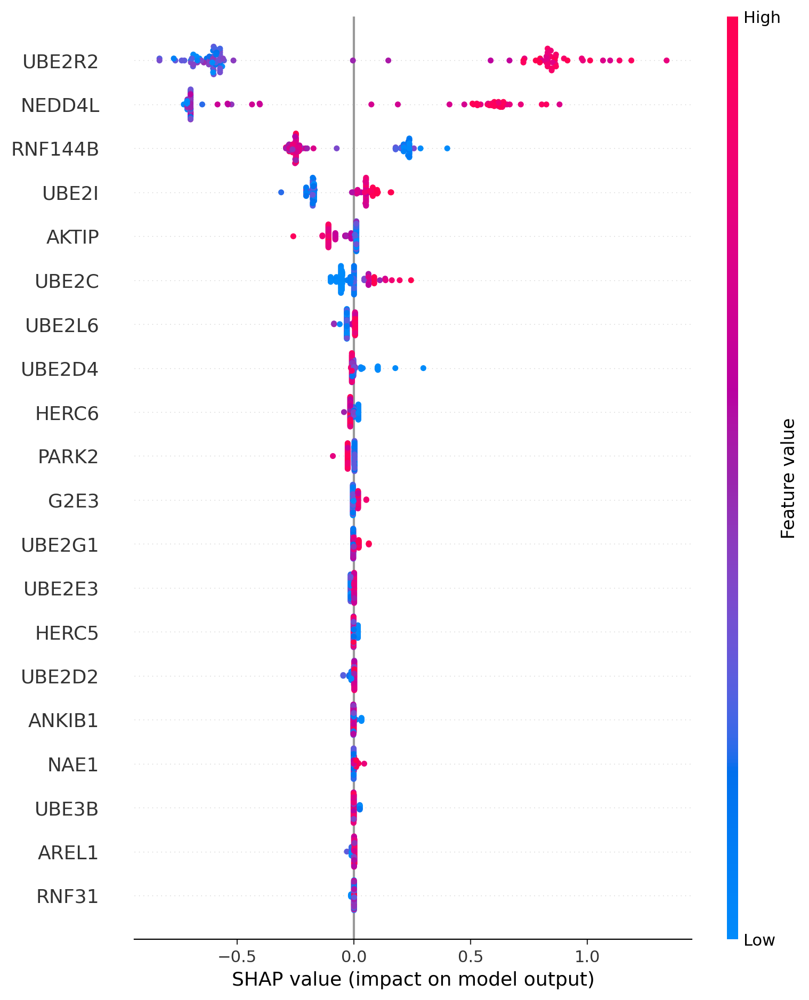

In [101]:
shap.summary_plot(shap_values[2], X_test, feature_names=feature_labels, color_bar=True)


In [1]:
help(shap.decision_plot)


Help on function decision in module shap.plots._decision:

decision(base_value, shap_values, features=None, feature_names=None, feature_order='importance', feature_display_range=None, highlight=None, link='identity', plot_color=None, axis_color='#333333', y_demarc_color='#333333', alpha=None, color_bar=True, auto_size_plot=True, title=None, xlim=None, show=True, return_objects=False, ignore_warnings=False, new_base_value=None, legend_labels=None, legend_location='best') -> Optional[shap.plots._decision.DecisionPlotResult]
    Visualize model decisions using cumulative SHAP values.
    
    Each plotted line explains a single model prediction. If a single prediction is plotted, feature values will be
    printed in the plot (if supplied). If multiple predictions are plotted together, feature values will not be printed.
    Plotting too many predictions together will make the plot unintelligible.
    
    Parameters
    ----------
    base_value : float or numpy.ndarray
        This is t

Shap decision plot for class: 0


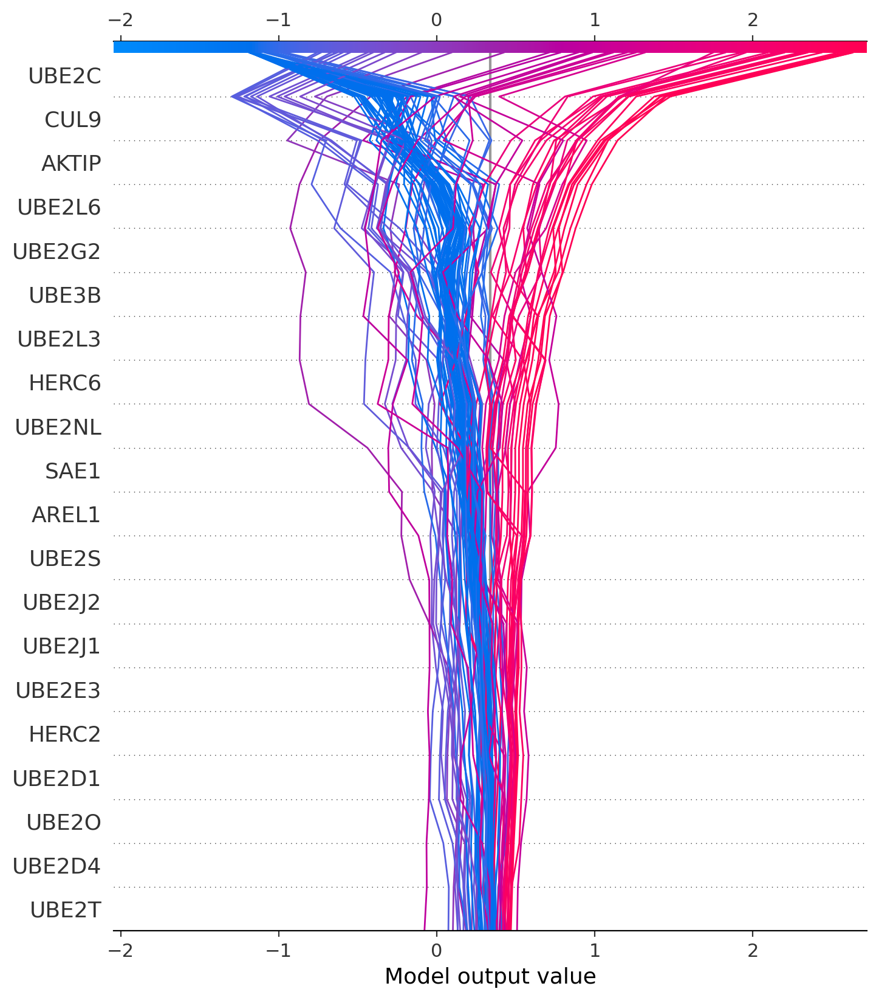

Shap decision plot for class: 1


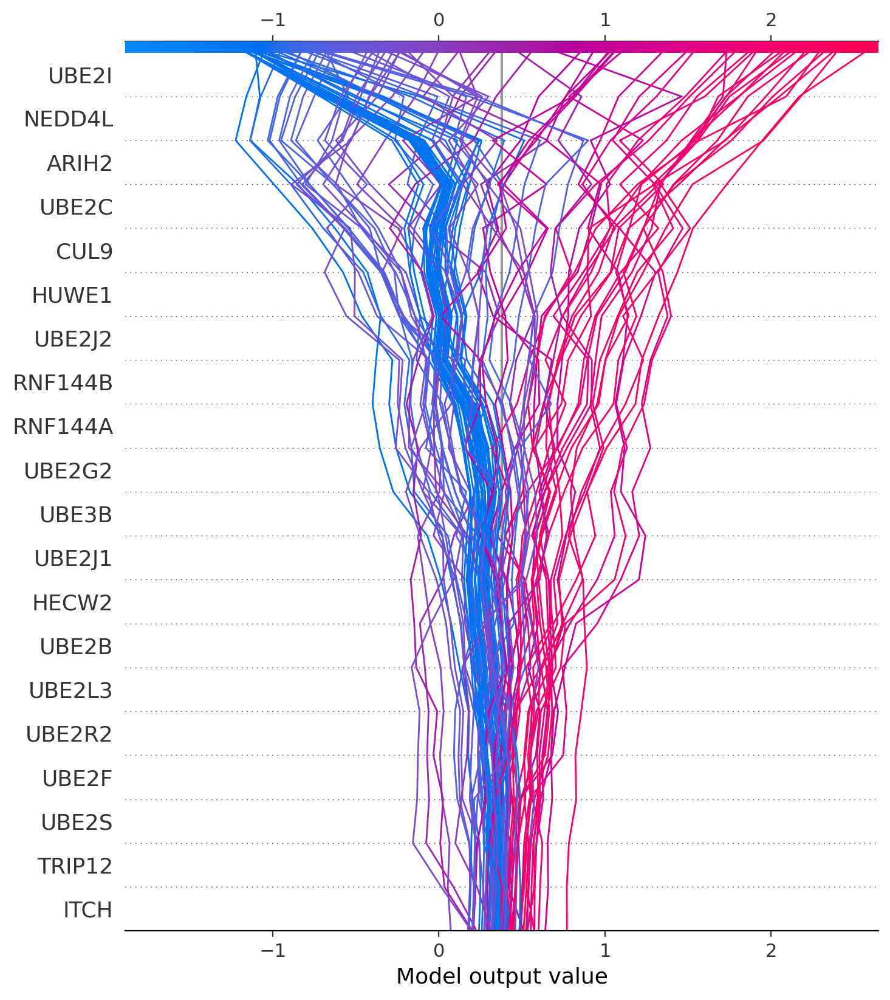

Shap decision plot for class: 2


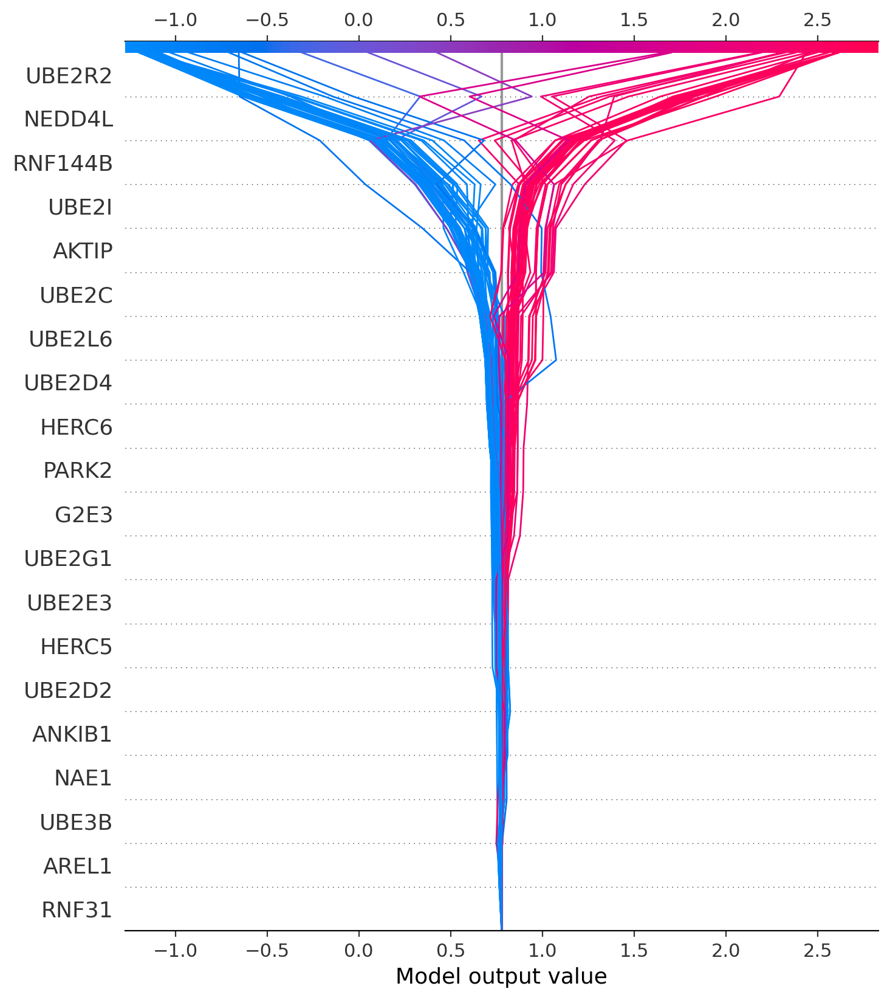

In [93]:
for i in range(3):   
    print(f'Shap decision plot for class: {i}')

    shap.decision_plot(explainer.expected_value[i], shap_values[i], X.columns)


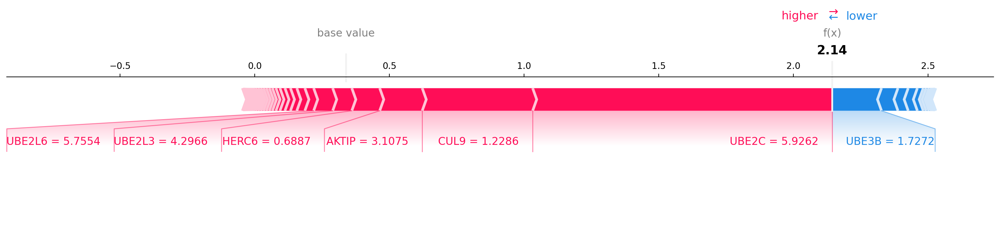

In [121]:
shap.plots.force(explainer.expected_value[0], shap_values[0][0,:], X.iloc[0, :], matplotlib = True)

Shap decision plot for class: Adolescence_Adulthood


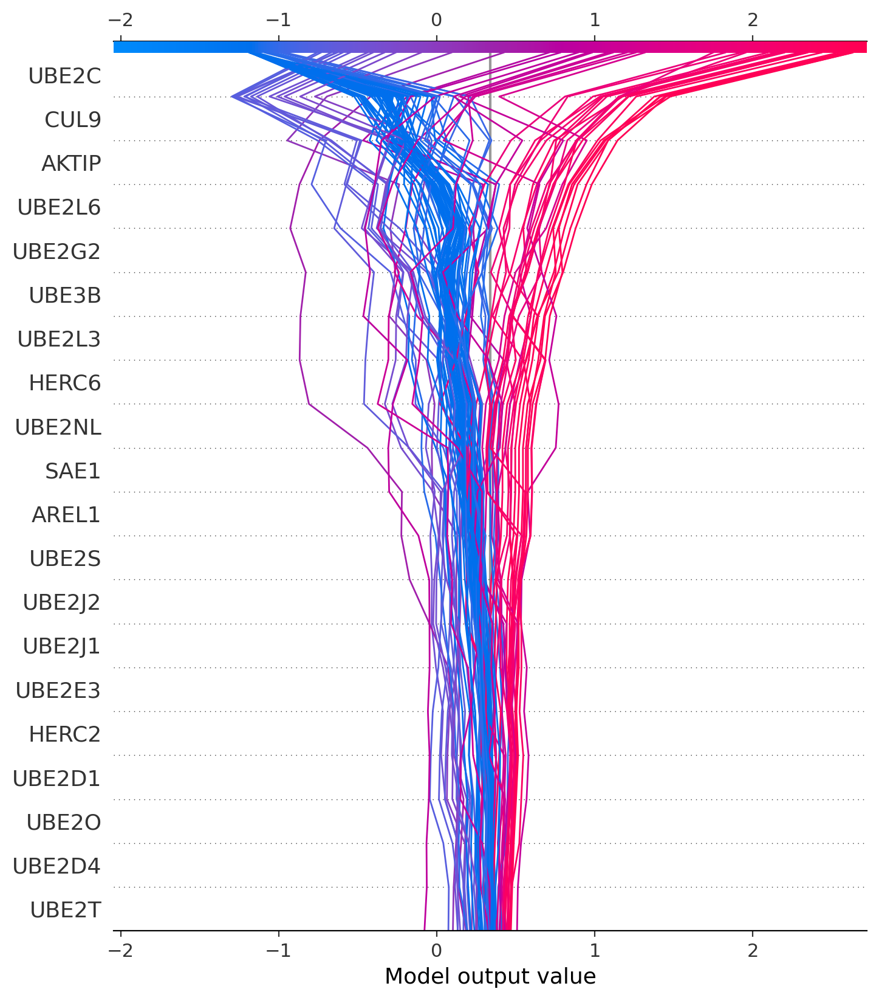

Shap decision plot for class: Infancy_to_LateChildhood


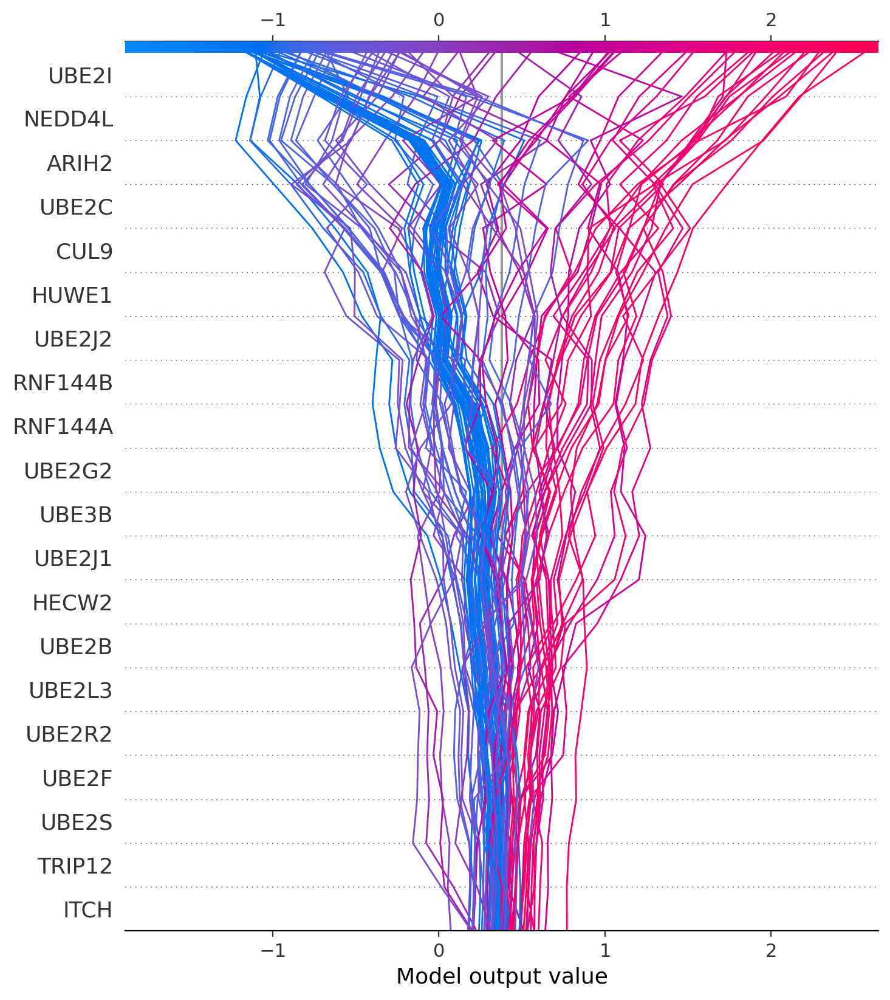

Shap decision plot for class: Prenatal


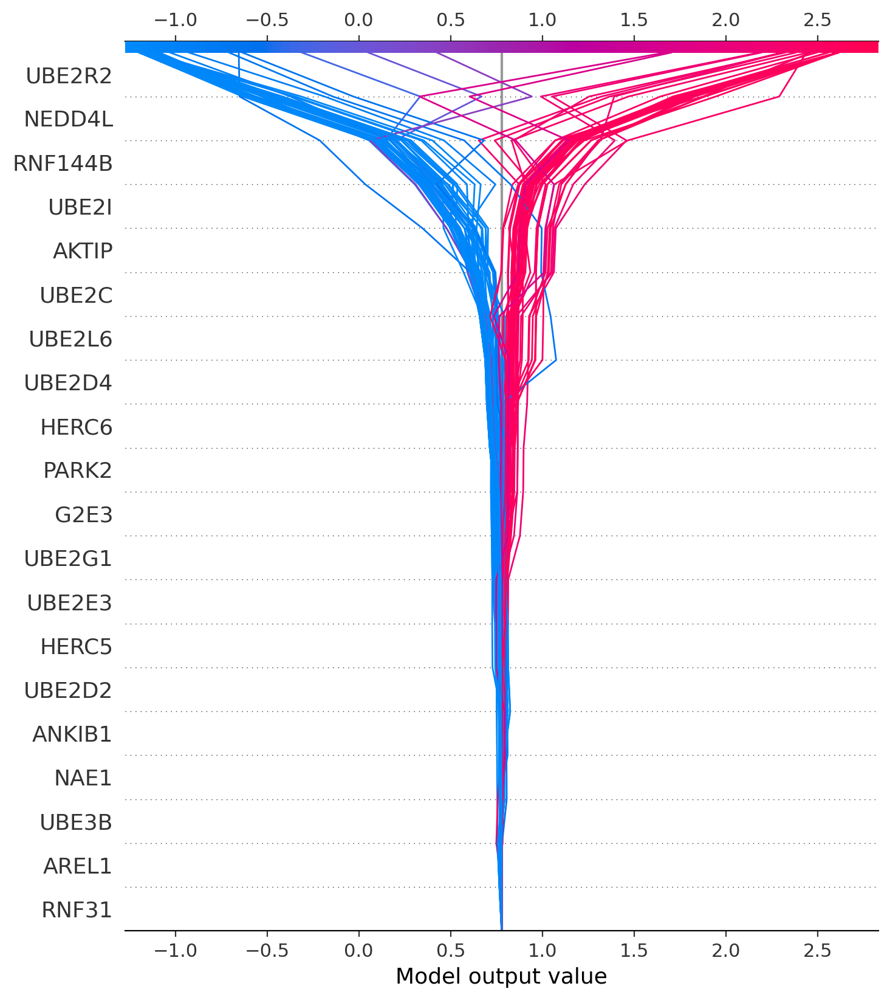

In [96]:
from sklearn.preprocessing import LabelEncoder


predictions = xgb_grid.predict(X_test)


label_encoder = LabelEncoder()
label_encoder.fit(y)


explainer = shap.TreeExplainer(xgb_grid)
shap_values = explainer.shap_values(X_test, check_additivity=False)

feature_labels = X.columns


class_labels = label_encoder.inverse_transform(range(len(label_encoder.classes_)))


for i, class_label in enumerate(class_labels):
    print(f'Shap decision plot for class: {class_label}')
    shap.decision_plot(explainer.expected_value[i], shap_values[i], X.columns)
